In [1]:
import os
os.chdir("/home/tangir/crmbm/python/pastis")

from IPython import get_ipython
get_ipython().magic("clear")

import matplotlib.pylab as plt
import matplotlib.dates as mdates
import mrs.reco as reco
import mrs.sim as sim
import mrs.log as log
import mrs.aliases as xxx
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import suspect
import datetime

plt.close("all")
plt.rcParams['figure.dpi'] = 75
plt.rcParams['figure.max_open_warning'] = 1000
plt.rcParams["figure.figsize"] = [8, 6]
# get_ipython().magic("matplotlib inline")
get_ipython().magic("matplotlib notebook")
log.setLevel(log.INFO)

cm = sns.color_palette("rocket", as_cmap=True)
#pd.set_option('display.max_rows', 50)
#pd.options.mode.chained_assignment = None  # default='warn'

(DEBUG) Loaded backend nbAgg version unknown.


# Prepare dataframe

## Load data
Load datasets from SC and brain

In [2]:
df_sc = pd.read_pickle("/home/tangir/crmbm/acq_db/sc.pkl")
df_sc = df_sc.reset_index()
df_sc = df_sc.set_index([df_sc.columns[0], "reco_template_name"])

df_sc_no_dr = pd.read_pickle("/home/tangir/crmbm/acq_db/sc_nodatarej.pkl")
df_sc_no_dr = df_sc_no_dr.reset_index()
df_sc_no_dr = df_sc_no_dr.set_index([df_sc_no_dr.columns[0], "reco_template_name"])

df_sc_no_dr_no_rea = pd.read_pickle("/home/tangir/crmbm/acq_db/sc_nodatarej_norea.pkl")
df_sc_no_dr_no_rea = df_sc_no_dr_no_rea.reset_index()
df_sc_no_dr_no_rea = df_sc_no_dr_no_rea.set_index([df_sc_no_dr_no_rea.columns[0], "reco_template_name"])

df_brain = pd.read_pickle("/home/tangir/crmbm/acq_db/brain.pkl")
df_brain = df_brain.reset_index()
df_brain = df_brain.set_index([df_brain.columns[0], "reco_template_name"])

df = pd.concat([df_sc, 
                df_sc_no_dr, 
                df_sc_no_dr_no_rea, 
                df_brain])

df

,,reco_dataset_legend,reco_dataset_physio_file,reco_dataset_imaging_file,reco_dataset_resp_bpm,reco_dataset_heart_bpm,reco_dataset_comment,reco_dataset_raw_files,reco_dataset_raw_data,reco_dataset_raw_analysis_results_phasing_snr,reco_dataset_raw_analysis_results_phasing_lw,...,reco_job_ref_data_analyzing_lw_magnitude_mode,reco_job_ref_data_analyzing_lw_display,reco_job_ref_data_analyzing_lw_display_range_ppm,timestamp,reco_dataset_raw_analysis_results,reco_dataset_raw_ref_data_analysis_results,reco_dataset_physio-file,reco_dataset_imaging-file,reco_dataset_raw_data_sequence_tm,reco_dataset_dcm_data_sequence_tm
index,reco_template_name,,,,,,,,,,,,,,,,,,,,,
405976f0de3db2b1ea8b83c3accc8994,sc,#0 sLASER R:N=20:1,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/296_ym_p1_brainmo...,"[(333.05466861857826+0.46635323403811224j), (3...",3.573111,20.751953,...,False,False,"[1, 6]",2021-06-21 23:47:01.546082,NaN,NaN,NaN,NaN,NaN,NaN
fb81785a61e346c7fdbb37479f312ca5,sc,#0 sLASER R:N=25:1,None,None,None,None,No REF scan !,[/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/...,"[(434.2001474900533+8.687858458699063j), (424....",5.497603,21.362305,...,False,False,"[1, 6]",2021-06-21 23:48:23.842165,NaN,NaN,NaN,NaN,NaN,NaN
2fff316122fc89a0b4d1f918f6cd62d8,sc,#1 sLASER R:N=25:1 trig,None,None,None,None,No REF scan !,[/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/...,"[(462.82838959982934+61.37810233592992j), (443...",4.809585,19.531250,...,False,False,"[1, 6]",2021-06-21 23:48:23.842165,NaN,NaN,NaN,NaN,NaN,NaN
77db8d723204884d29a997944390611b,sc,#0 crappy,None,None,None,None,None,"[None, None]",None,NaN,NaN,...,False,False,"[1, 6]",2021-06-21 23:48:27.725362,None,None,NaN,NaN,NaN,NaN
40ef3af628211f936a93c79adb00ac9d,sc,#0 sLASER 20:1 cardiac trig,None,None,20,55,None,[/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/...,"[(412.65411847891136-216.10135203851792j), (47...",3.404205,22.583008,...,False,False,"[1, 6]",2021-06-21 23:49:23.921209,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16d71eb60d555d564285780e3a956a3b,brain,#0 brain - sLASER R:N=5:5,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/296_ym_p1_brainmo...,"[(1073.236138723916+60.47024795412032j), (988....",36.591807,15.869141,...,False,False,"[1, 6]",2021-06-21 23:48:23.337993,NaN,NaN,NaN,NaN,NaN,NaN
b057a3e07319341e032e3c6c36ec4d83,brain,#1 brain - sLASER R:N=25:1,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/296_ym_p1_brainmo...,"[(700.4723803030752-55.3417458501844j), (664.9...",50.469007,11.596680,...,False,False,"[1, 6]",2021-06-21 23:48:23.337993,NaN,NaN,NaN,NaN,NaN,NaN
9b787dca1397a14819e7931428cffca3,brain,#2 brain - STEAM,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/296_ym_p1_brainmo...,"[(468.7885129579473+944.1246253059866j), (222....",18.948564,17.700195,...,False,False,"[1, 6]",2021-06-21 23:48:23.337993,NaN,NaN,NaN,NaN,26.58,26.58


## Fix missing raw datasets
by replacing them by the dicom datasets

In [3]:
columns2replace_src = df.columns[df.columns.str.startswith("reco_dataset_dcm")].tolist()
columns2replace_dst = ["reco_dataset_raw" + c[16:] for c in columns2replace_src]

for ic in range(len(columns2replace_dst)):
    df.at[df["reco_dataset_raw_data_obj"].isna(), columns2replace_dst[ic]] = df.loc[df["reco_dataset_raw_data_obj"].isna(), columns2replace_src[ic]]


## Additional columns
Like BMI, BFP, etc.

SNR is normalized by:
* voxel size
* number of averages (post-data-rejection)

Therefore
* SNR values are divided by voxel volume and multiplied by a mean volume to get usual SNR values
* SNR values are divided by $\sqrt(NA)$ kept after data rejection and multiplied by $\sqrt(128)$

In [4]:
# patient name
df["patient_name"] = df["reco_dataset_dcm_data_name"].astype(str)

# patient id
df["patient_id"] = df["patient_name"].str[0:3]

# pass number
df["pass"] = [1 if "P1" in s else 2 for s in df["patient_name"]]

df["patient_pass_id"] = df["patient_id"] + "_P" + df["pass"].astype(str)

# calculate age
df["patient_age"] = (datetime.date.today().year - pd.DatetimeIndex(df["reco_dataset_dcm_data_birthday"]).year)

# calculate bmi
df["patient_bmi"] = df["reco_dataset_dcm_data_weight"] / df["reco_dataset_dcm_data_height"]**2

# rename other patient-related stuff
df = df.rename(columns = {'reco_dataset_raw_data_height': 'patient_height',
                          'reco_dataset_raw_data_weight': 'patient_weight',
                          'reco_dataset_raw_data_sex': 'patient_sex'})

# renaming a few object columns
df = df.rename(columns = {'reco_dataset_raw_data': 'data_obj',
                          'reco_dataset_raw_data_sequence_obj': 'sequence_obj'})

In [5]:
# voxel positions
df["voxel_pos_x_mm"] = [o.to_scanner(0, 0, 0)[0] for o in df["data_obj"]]
df["voxel_pos_y_mm"] = [o.to_scanner(0, 0, 0)[1] for o in df["data_obj"]]
df["voxel_pos_z_mm"] = [o.to_scanner(0, 0, 0)[2] for o in df["data_obj"]]


In [6]:
# CSDE
# I still have issues to know the orientation...
# first voxel dimensions order
df["voxel_size_argsort"] = [np.argsort(o.voxel_size) for o in df["data_obj"]]
# reorder assuming Y/AP is the shortest and Z/HF is the longest voxel
df["voxel_size_x_mm"] = [o.voxel_size[inds][1] for o, inds in zip(df["data_obj"], df["voxel_size_argsort"])]
df["voxel_size_y_mm"] = [o.voxel_size[inds][0] for o, inds in zip(df["data_obj"], df["voxel_size_argsort"])]
df["voxel_size_z_mm"] = [o.voxel_size[inds][2] for o, inds in zip(df["data_obj"], df["voxel_size_argsort"])]
# calculate voxel volume
df["voxel_size_min"] = [np.min(o.voxel_size) for o in df["data_obj"]]
df["voxel_vol_cm3"] = df["voxel_size_x_mm"]/10 * df["voxel_size_y_mm"]/10 * df["voxel_size_z_mm"]/10
#
df["csde_x"] = [3400.0 if(type(o) == sim.mrs_seq_eja_svs_slaser) else np.nan for o in df["sequence_obj"]]
df["csde_x"] = df["csde_x"] / (df["voxel_size_x_mm"] * 0.001)
df["csde_x"] = 1000.0 * df["reco_dataset_raw_data_sequence_f0"] / df["csde_x"]
df["csde_x"] = df["csde_x"] / df["voxel_size_x_mm"] * 100.0

df["csde_y"] = [o.pulse_rfc_r / (o.pulse_rfc_duration / 1000.0) if(type(o) == sim.mrs_seq_eja_svs_slaser) else np.nan for o in df["sequence_obj"]]
df["csde_y"] = df["csde_y"] / (df["voxel_size_y_mm"] * 0.001)
df["csde_y"] = 1000.0 * df["reco_dataset_raw_data_sequence_f0"] / df["csde_y"]
df["csde_y"] = df["csde_y"] / df["voxel_size_y_mm"] * 100.0 

df["csde_z"] = [o.pulse_rfc_r / (o.pulse_rfc_duration / 1000.0) if(type(o) == sim.mrs_seq_eja_svs_slaser) else np.nan for o in df["sequence_obj"]]
df["csde_z"] = df["csde_z"] / (df["voxel_size_z_mm"] * 0.001)
df["csde_z"] = 1000.0 * df["reco_dataset_raw_data_sequence_f0"] / df["csde_z"]
df["csde_z"] = df["csde_z"] / df["voxel_size_z_mm"] * 100.0

In [7]:
# estimate artefact intensity for each dataset
df["artefact_signal"] = np.array([o.analyze_snr_1d([4.9, 5.5], [-2, -1]) for o in df["data_obj"]])[:, 1]

# estimate water intensity for each dataset
df["water_signal"] = np.array([o.analyze_snr_1d([4.6, 4.8], [-2, -1]) for o in df["data_obj"]])[:, 1]

(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER R:N=20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -5.45E+02, N = 2.76E+02, SNR = -1.98!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER R:N=25:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 9.50E+02, N = 2.66E+02, SNR = 3.57!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER R:N=25:1 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -4.44E+02, N = 3.48E+02, SNR = -1.28!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 crappy [DCM]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.71E+04, N = 1.72E+02, SNR = 390.07!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 cardiac trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.06E+03, N = 4.15E+02, SNR = 4.96!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20:1 resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -5.37E+03, N = 6.88E+02, SNR = -7.80!
(INFO)  MRSData2.analyze_snr_1d: results for [#2 sL

(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -6.82E+02, N = 3.27E+02, SNR = -2.08!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 5:5 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.33E+03, N = 3.94E+02, SNR = 11.00!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.96E+04, N = 3.14E+02, SNR = 94.28!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 5:5 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 8.42E+03, N = 2.95E+02, SNR = 28.54!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -2.77E+03, N = 4.49E+02, SNR = -6.17!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 10:2 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.51E+02, N = 3.58E+02, SNR = 1.82!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRS

(INFO)  MRSData2.analyze_snr_1d: S = 9.03E+02, N = 2.70E+02, SNR = 3.35!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 10:2 (REF with OVS) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.17E+02, N = 3.19E+02, SNR = 1.62!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER TE=52ms [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = -3.12E+02, N = 3.25E+02, SNR = -0.96!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 1st try (30-40Hz water LW) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.62E+05, N = 3.42E+02, SNR = 764.90!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 2nd try (25Hz water LW) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.12E+05, N = 5.76E+02, SNR = 368.19!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 NA=128 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.13E+02, N = 2.74E+02, SNR = 2.24!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20/1 NA=128 notrig [RAW]] coming...
(INFO)  MRSData2.

(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 NA=128 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.80E+04, N = 3.24E+02, SNR = 117.39!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20/1 NA=64 notrig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.99E+04, N = 4.20E+02, SNR = 71.17!
(INFO)  MRSData2.analyze_snr_1d: results for [#2 sLASER 5/5 NA=64 notrig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 1.14E+04, N = 3.67E+02, SNR = 31.11!
(INFO)  MRSData2.analyze_snr_1d: results for [#3 sLASER 10/2 NA=64 notrig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.61E+04, N = 4.24E+02, SNR = 179.68!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 10/2 NA=64 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.22E+04, N = 2.85E+02, SNR = 183.14!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.22E+04, N = 2.97E+02, SNR = 108.15!
(INFO)  MRSData2.analyz

(INFO)  MRSData2.analyze_snr_1d: results for [#0 crappy [DCM]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.06E+03, N = 1.72E+02, SNR = 23.59!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 cardiac trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.42E+04, N = 5.29E+02, SNR = 83.47!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20:1 resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.91E+04, N = 3.99E+02, SNR = 97.91!
(INFO)  MRSData2.analyze_snr_1d: results for [#2 sLASER 20:1 no trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.41E+04, N = 4.84E+02, SNR = 70.51!
(INFO)  MRSData2.analyze_snr_1d: results for [#3 sLASER 10:2 repos. + resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.92E+04, N = 4.81E+02, SNR = 164.61!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.03E+04, N = 2.94E+02, SNR = 69.02!
(INFO)  MRSData2.analyze_snr_1d:

In [8]:
# SNR & LW final estimations
# what was the final job?
last_job_name = np.unique([jl[-1]['job_name'] for jl in df["reco_job_list"]])[-1]
#
df["lw_final"] = df["reco_dataset_raw_analysis_results_" + last_job_name + "_lw"]
df["snr_final"] = df["reco_dataset_raw_analysis_results_" + last_job_name + "_snr"]
#
df["lw_ref_final"] = df["reco_dataset_raw_ref_data_analysis_results_lw"]
df["snr_ref_final"] = df["reco_dataset_raw_ref_data_analysis_results_snr"]

# NA normalization
na_norm = 128.0
df["snr_final_norm"] = df["snr_final"] / \
[np.sqrt(dr[-1]["Post-rejection"]["na"]) if dr is not None else seq_na \
for (dr, seq_na) in zip(df["reco_dataset_raw_data_rejection"], df["reco_dataset_raw_data_sequence_na"])] \
* np.sqrt(na_norm)
df["artefact_signal_norm"] = df["artefact_signal"] / \
[np.sqrt(dr[-1]["Post-rejection"]["na"]) if dr is not None else seq_na \
for (dr, seq_na) in zip(df["reco_dataset_raw_data_rejection"], df["reco_dataset_raw_data_sequence_na"])] \
* np.sqrt(na_norm)
df["water_signal_norm"] = df["water_signal"] / \
[np.sqrt(dr[-1]["Post-rejection"]["na"]) if dr is not None else seq_na \
for (dr, seq_na) in zip(df["reco_dataset_raw_data_rejection"], df["reco_dataset_raw_data_sequence_na"])] \
* np.sqrt(na_norm)

# voxel normalization
mean_voxel_vol = df["voxel_vol_cm3"].mean()
df["snr_final_norm"] = df["snr_final_norm"] / df["voxel_vol_cm3"] * mean_voxel_vol
df["snr_final_norm_voxel_only"] = df["snr_final"] / df["voxel_vol_cm3"] * mean_voxel_vol
df["snr_ref_final_norm"] = df["snr_ref_final"] / df["voxel_vol_cm3"] * mean_voxel_vol
df["artefact_signal_norm"] = df["artefact_signal_norm"] / df["voxel_vol_cm3"] * mean_voxel_vol
df["water_signal_norm"] = df["water_signal_norm"] / df["voxel_vol_cm3"] * mean_voxel_vol

# calculate theoretical scan time knowing NA and TR, neglicting resp. trig
df["acqtime"] = df["reco_dataset_raw_data_sequence_tr"] / 1000.0 * (df["reco_dataset_raw_data_sequence_na"] \
                                                                     + df["reco_dataset_raw_data_sequence_ds"])

df = df.rename(columns = {'reco_dataset_dcm_data_sequence_eff_acquisition_time': 'acqtime_eff'})

In [9]:
# signal stability

df["prerejection_amplitude_mean"] = [dr[-1]["Pre-rejection"]["measurements"][:,0].mean(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]
df["prerejection_amplitude_std"] = [dr[-1]["Pre-rejection"]["measurements"][:,0].std(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]

df["prerejection_linewidth_mean"] = [dr[-1]["Pre-rejection"]["measurements"][:,1].mean(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]
df["prerejection_linewidth_std"] = [dr[-1]["Pre-rejection"]["measurements"][:,1].std(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]

df["prerejection_chemical_shift_mean"] = [dr[-1]["Pre-rejection"]["measurements"][:,2].mean(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]
df["prerejection_chemical_shift_std"] = [dr[-1]["Pre-rejection"]["measurements"][:,2].std(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]

df["prerejection_phase_mean"] = [dr[-1]["Pre-rejection"]["measurements"][:,3].mean(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]
df["prerejection_phase_std"] = [dr[-1]["Pre-rejection"]["measurements"][:,3].std(axis=0) \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]

# rejection rate
df["rejection_rate_prct"] = [(dr[-1]["Pre-rejection"]["na"] - dr[-1]["Post-rejection"]["na"]) / dr[-1]["Pre-rejection"]["na"] * 100.0 \
                                    if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]

# best rejection method
df["rejection_method"] = [dr[-1]["Automatic data rejection methods"]["Best method"] if dr is not None \
                                    else np.nan \
                                    for dr in df["reco_dataset_raw_data_rejection"]]


In [10]:
df["shim_sum"] = 0
df["shim_first_order_sum"] = 0
df["shim_second_order_sum"] = 0

for this_shim_index in range(8):
    df_key = "reco_dataset_raw_data_sequence_shims_" + str(this_shim_index)
    df[df_key] = [s[this_shim_index] for s in df["reco_dataset_raw_data_sequence_shims"]]
        
    # add up all shims
    if(this_shim_index < 3):
        df["shim_first_order_sum"] += df[df_key].abs()
    else:
        df["shim_second_order_sum"] += df[df_key].abs()
          
    df["shim_sum"] += df[df_key].abs()

## Pretty subject names

In [11]:
# get list of patients
patient_list_int = df["patient_id"].unique()
# build renaming dict
subject_name_map = {}
for this_index, this_patient in enumerate(patient_list_int):
    subject_name_map[this_patient] =  "S%02.d" % (this_index + 1)

df["patient_id_pretty"] = df["patient_id"].map(subject_name_map)
df["patient_pass_id_pretty_suffix"] = "(P" + df["pass"].astype(str) + ")"
df.at[df.index.get_level_values('reco_template_name').str.startswith("brain"), \
      "patient_pass_id_pretty_suffix"] = "(brain)"

df["patient_pass_id_pretty"] = df["patient_id_pretty"] + " " + df["patient_pass_id_pretty_suffix"]
    
df[["patient_id", "patient_id_pretty", "patient_pass_id", "patient_pass_id_pretty"]]

,,patient_id,patient_id_pretty,patient_pass_id,patient_pass_id_pretty
index,reco_template_name,,,,
405976f0de3db2b1ea8b83c3accc8994,sc,296,S01,296_P1,S01 (P1)
fb81785a61e346c7fdbb37479f312ca5,sc,300,S02,300_P1,S02 (P1)
2fff316122fc89a0b4d1f918f6cd62d8,sc,300,S02,300_P1,S02 (P1)
77db8d723204884d29a997944390611b,sc,304,S03,304_P1,S03 (P1)
40ef3af628211f936a93c79adb00ac9d,sc,307,S04,307_P1,S04 (P1)
...,...,...,...,...,...
16d71eb60d555d564285780e3a956a3b,brain,296,S01,296_P1,S01 (brain)
b057a3e07319341e032e3c6c36ec4d83,brain,296,S01,296_P1,S01 (brain)
9b787dca1397a14819e7931428cffca3,brain,296,S01,296_P1,S01 (brain)


## Separate spinal cord and brain datasets

In [12]:
df_sc = df.loc[df.index.get_level_values('reco_template_name').str.startswith("sc")]
df_brain = df.loc[df.index.get_level_values('reco_template_name').str.startswith("brain")]

## Keep only resp-gating sLASER scans
Keep only:
* semi-LASER scans
* with resp gating
and check that it does not remove any patient of study

In [13]:
n_patient_study_p1_orig = df_sc.loc[df_sc["pass"] == 1]["patient_id"].nunique()

# keep this for big stats about data quality
df_sc_slaser = df_sc.loc[(df_sc["reco_dataset_raw_data_sequence_name"] == "eja_svs_slaser")]
df_brain_slaser = df_brain.loc[df_brain["reco_dataset_raw_data_sequence_name"] == "eja_svs_slaser"]

df_sc_slaser_resptrig = df_sc.loc[(df_sc["reco_dataset_raw_data_sequence_name"] == "eja_svs_slaser")
                          & (df_sc["reco_dataset_raw_data_sequence_gating_mode"] == sim.gating_signal_source.RESP_GATING)]

df_removed = df_sc.loc[(df_sc["reco_dataset_raw_data_sequence_name"] != "eja_svs_slaser")
                  | (df_sc["reco_dataset_raw_data_sequence_gating_mode"] != sim.gating_signal_source.RESP_GATING)]

# check that we did not remove any patient/study
n_patient_study_p1_after_filtering_slaser = df_sc_slaser.loc[df_sc_slaser["pass"] == 1]["patient_id"].nunique()
n_patient_study_p1_after_filtering_slaser_resptrig = df_sc_slaser_resptrig.loc[df_sc_slaser_resptrig["pass"] == 1]["patient_id"].nunique()

df_removed[["patient_name", "reco_dataset_raw_data_sequence_name", "reco_dataset_raw_data_sequence_gating_mode"]]

,,patient_name,reco_dataset_raw_data_sequence_name,reco_dataset_raw_data_sequence_gating_mode
index,reco_template_name,,,
405976f0de3db2b1ea8b83c3accc8994,sc,296_YM_P1_BRAINMOELLE,eja_svs_slaser,gating_signal_source.CARDIAC_GATING
fb81785a61e346c7fdbb37479f312ca5,sc,300_PM_P1_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING
77db8d723204884d29a997944390611b,sc,304_KA_P1_MOELLE,eja_svs_slaser,gating_signal_source.CARDIAC_GATING
40ef3af628211f936a93c79adb00ac9d,sc,307_AP_P1_MOELLE,eja_svs_slaser,gating_signal_source.CARDIAC_GATING
4a3a0b1b9f85f1928b9bfb342358fef4,sc,307_AP_P1_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING
90a5b0c9d27daa2396d73e53f5a90afe,sc,355_ST_P1_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING
caf8ec7f9e1026afbfa1e2c41ba43539,sc,311_SL_P2_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING
49872ea4c73b9206c804c4fdaa298ed9,sc,336_NB_P2_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING
fd2940e9489a5d28773792aeb95f54e7,sc,336_NB_P2_MOELLE,eja_svs_slaser,gating_signal_source.NO_GATING


I have been going over the datasets rejected here:

* 296_ym_p1_brainmoelle: one of the first SC scans, was not resp gating at the time, too bad but only P1 (no P2)
* 300_pm_p1_moelle: removing one no gating scan, there is another one with trig so OK
* 304_ka_p1_moelle: removing this P1 study (there is a P2 that will be considered P1), data was crappy, dicom only, and no trig for some reason
* 307_ap_p1_moelle: removing 2 scans (no trig and cardiac trig) that were done for tests, still a 2 resp trig left)
* 355_st_p1_moelle: removing scan and therefore patient, no resp trig because I was in hurry. Too bad, the data is not soo bad and it was a fat guy (cohort stats) :(
* 311_sl_p2_moelle, 336_nb_p2_moelle: just some trig tests removed, no patient or study removed

So removed 3 patient or study in total because not following the standard protocol (semiLASER + resp gating)

In [14]:
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)


* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15


## Remove 310-mg-p1-moelle
I choose not to include this subject in the group: very strong side MRI effects, nearly puked, probably moved
In other words, if the inclusion process was improved, he would not have passed.

In [15]:
df = df_sc_slaser_resptrig

df_310 = df.loc[(df["patient_id"] == "310")]
df_sc_slaser_resptrig_no_310 = df.drop(df_310.index)

n_patient_study_p1_after_filtering_slaser_resptrig_no_310 = df_sc_slaser_resptrig_no_310.loc[df_sc_slaser_resptrig_no_310["pass"] == 1]["patient_id"].nunique()

df_310[["patient_name", "reco_dataset_legend", "reco_dataset_raw_data_sequence_name", "reco_dataset_raw_data_sequence_gating_mode"]]

patient_name  \
index                            reco_template_name                     
01a46c3d8ebdb2912567745a61ef0d24 sc                  310_MG_P1_MOELLE   
                                 sc_nodatarej        310_MG_P1_MOELLE   
                                 sc_nodatarej_norea  310_MG_P1_MOELLE   

                                                    reco_dataset_legend  \
index                            reco_template_name                       
01a46c3d8ebdb2912567745a61ef0d24 sc                      #0 sLASER 20:1   
                                 sc_nodatarej            #0 sLASER 20:1   
                                 sc_nodatarej_norea      #0 sLASER 20:1   

                                                    reco_dataset_raw_data_sequence_name  \
index                            reco_template_name                                       
01a46c3d8ebdb2912567745a61ef0d24 sc                                      eja_svs_slaser   
                                 sc_nodatarej                            eja_svs_slaser   
                                 sc_nodatarej_norea                      eja_svs_slaser   

                                                    reco_dataset_raw_data_sequence_gating_mode  
index                            reco_template_name                                             
01a46c3d8ebdb2912567745a61ef0d24 sc                           gating_signal_source.RESP_GATING  
                                 sc_nodatarej                 gating_signal_source.RESP_GATING  
                                 sc_nodatarej_norea           gating_signal_source.RESP_GATING

## Stats

In [17]:
df = df_sc_slaser_resptrig_no_310.loc[(df_sc_slaser_resptrig_no_310["pass"] == 1)].drop_duplicates("patient_id")

print("n = %d" % len(df))

print("Mean age = %.2fyears +/-%.2f" % (df["patient_age"].mean(), df["patient_age"].std()))
print("Mean weight = %.2fkgs +/-%.2f" % (df["patient_weight"].mean(), df["patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f" % (df["patient_height"].mean(), df["patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f" % (df["patient_bmi"].mean(), df["patient_bmi"].std()))

sex_counts = df.groupby("patient_sex")
print("Sex = M(%d) F(%d)" % (df.loc[sex_counts.groups["M"]]["patient_id"].nunique(), 
                             df.loc[sex_counts.groups["F"]]["patient_id"].nunique()))

n = 14
Mean age = 28.71years +/-5.00
Mean weight = 56.36kgs +/-14.52
Mean height = 1.65m +/-0.12
Mean BMI = 20.38 +/-2.86
Sex = M(4) F(10)


## Remove strong artefact datasets
Criteria: when the artefact is stronger than the residual water peak

In [16]:
df = df_sc_slaser_resptrig_no_310

df_strong_artefact = df.loc[ (df["artefact_signal"] > df["water_signal"])  ]
df_sc_slaser_resptrig_no_310_no_artefact = df.drop(df_strong_artefact.index)

n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact = df_sc_slaser_resptrig_no_310_no_artefact.loc[df_sc_slaser_resptrig_no_310_no_artefact["pass"] == 1]["patient_id"].nunique()

df_strong_artefact[["patient_name", "patient_id", "pass", "patient_pass_id"]]

,,patient_name,patient_id,pass,patient_pass_id
index,reco_template_name,,,,
3695a02a4fbf0153215cf09eaa21658e,sc,333_SC_P1_MOELLE,333,1,333_P1
42063831757801c81193689ead085d37,sc,304_KA_P2_MOELLE,304,2,304_P2
8b934ce052f541a6923805395f44bfb8,sc,304_KA_P2_MOELLE,304,2,304_P2
da13ac26d45806eaced75e7dd71df1f3,sc,333_SC_P2_MOELLE,333,2,333_P2
3695a02a4fbf0153215cf09eaa21658e,sc_nodatarej,333_SC_P1_MOELLE,333,1,333_P1
42063831757801c81193689ead085d37,sc_nodatarej,304_KA_P2_MOELLE,304,2,304_P2
8b934ce052f541a6923805395f44bfb8,sc_nodatarej,304_KA_P2_MOELLE,304,2,304_P2
da13ac26d45806eaced75e7dd71df1f3,sc_nodatarej,333_SC_P2_MOELLE,333,2,333_P2
fe34c6902afd341a0c81de0a0b6d6373,sc_nodatarej_norea,316_AP_P1_MOELLE,316,1,316_P1


In [17]:
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact)


* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = 14
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = 13


## Find any orphan P2s
and set them as P1 :)

In [18]:
# using previously filtered db
df = df_sc_slaser_resptrig_no_310_no_artefact

# find pass 1 patients
df_p1 = df.loc[(df["pass"] == 1)]

# find pass 2 patients which are not previously found pass 1 list
df_p2_orphan = df.loc[ (df["pass"] == 2) &
                        ~(df["patient_id"].isin(list(df_p1["patient_id"].unique()))) ]

df_p2_orphan[["patient_name", "patient_id", "pass", "patient_pass_id"]]

,,patient_name,patient_id,pass,patient_pass_id
index,reco_template_name,,,,


In [19]:
# changed to P1
df_sc_orphan_p2_fix = df_sc_slaser_resptrig_no_310_no_artefact
df_sc_orphan_p2_fix.at[df_p2_orphan.index, "pass"] = 1
df_sc_orphan_p2_fix.at[df_p2_orphan.index, "patient_pass_id"] = df_sc_orphan_p2_fix.loc[df_p2_orphan.index, "patient_pass_id"] + "_orphan"

df_sc_orphan_p2_fix[["patient_name", "patient_id", "pass", "patient_pass_id"]]

,,patient_name,patient_id,pass,patient_pass_id
index,reco_template_name,,,,
2fff316122fc89a0b4d1f918f6cd62d8,sc,300_PM_P1_MOELLE,300,1,300_P1
159437f4b7de93d40c7fef7853019df3,sc,307_AP_P1_MOELLE,307,1,307_P1
1baf6b702f39fefb5ad9e44179057ef7,sc,307_AP_P1_MOELLE,307,1,307_P1
a2b582b37a04bd4efc43138368bc0b96,sc,308_RS_P1_MOELLE,308,1,308_P1
7cb024e470b0b2b072436635a19a1c00,sc,311_SL_P1_MOELLE,311,1,311_P1
...,...,...,...,...,...
967a1b8dace220e916df680759f31d84,sc_nodatarej_norea,336_NB_P2_MOELLE,336,2,336_P2
90d883145e25fe54b74b05c16b56ace1,sc_nodatarej_norea,319_FC_P2_MOELLE,319,2,319_P2
e8481853cde6f05d66b1c43d8dd00e40,sc_nodatarej_norea,313_FT_P2_MOELLE,313,2,313_P2


## Keep only one scan per pass
Now, on resp-gating sLASER, keep only one scan per study based on SNR and LW. This is the core group that will be used for the paper's stats.

In [20]:
# using previously filtered db
df = df_sc_orphan_p2_fix

# need to keep the same scan independantly of the template
reference_template = "sc"
scanindex2keep_list = []

# first find the highest SNR scans for the reference template
this_df = df.loc[df.index.get_level_values('reco_template_name') == reference_template]
for this_ppi in list(df["patient_pass_id"].unique()):
    this_ppi_df_dup = this_df.loc[df["patient_pass_id"] == this_ppi]
    this_ppi_df_dup_best_snr = this_ppi_df_dup.loc[this_ppi_df_dup["snr_final"] == this_ppi_df_dup["snr_final"].max()]
    this_scan_index = this_ppi_df_dup_best_snr.index.get_level_values('index')[0]
    scanindex2keep_list.append(this_scan_index)
    
# now select this scan whatever the reco template
df_sc_onescan_per_study = df.loc[df.index.get_level_values('index').isin(scanindex2keep_list)]

n_patient_study_p1_after_filtering_all = df_sc_onescan_per_study.loc[df_sc_onescan_per_study["pass"] == 1]["patient_pass_id"].nunique()

df_sc_onescan_per_study[["patient_name", "patient_id", "pass", "patient_pass_id"]]

,,patient_name,patient_id,pass,patient_pass_id
index,reco_template_name,,,,
2fff316122fc89a0b4d1f918f6cd62d8,sc,300_PM_P1_MOELLE,300,1,300_P1
1baf6b702f39fefb5ad9e44179057ef7,sc,307_AP_P1_MOELLE,307,1,307_P1
a2b582b37a04bd4efc43138368bc0b96,sc,308_RS_P1_MOELLE,308,1,308_P1
7cb024e470b0b2b072436635a19a1c00,sc,311_SL_P1_MOELLE,311,1,311_P1
9f8067ea065153da5b3a352d58f6ca23,sc,313_FT_P1_MOELLE,313,1,313_P1
0a58f85af8c32d06cbbca74391447ad2,sc,314_YT_P1_MOELLE,314,1,314_P1
5f9a42662bfe3586bee57f3ead964778,sc,316_AP_P1_MOELLE,316,1,316_P1
f416f6db6cda52195e3b8046fc586ef2,sc,319_FC_P1_MOELLE,319,1,319_P1
b9875913db5c0f321922f819401cc02e,sc,328_AF_P1_MOELLE,328,1,328_P1


Now on brain data (simple, only one reco_template):

In [21]:
# using previously filtered db
df = df_brain_slaser

df_brain_onescan_per_study = df.groupby(["reco_template_name", "patient_pass_id"]).apply(lambda x: x.loc[x['snr_final'] == x['snr_final'].max()])
df_brain_onescan_per_study = df_brain_onescan_per_study.reset_index(level=[0, 1], drop=True)

df_brain_onescan_per_study

,,reco_dataset_legend,reco_dataset_physio_file,reco_dataset_imaging_file,reco_dataset_resp_bpm,reco_dataset_heart_bpm,reco_dataset_comment,reco_dataset_raw_files,data_obj,reco_dataset_raw_analysis_results_phasing_snr,reco_dataset_raw_analysis_results_phasing_lw,...,reco_dataset_raw_data_sequence_shims_1,reco_dataset_raw_data_sequence_shims_2,reco_dataset_raw_data_sequence_shims_3,reco_dataset_raw_data_sequence_shims_4,reco_dataset_raw_data_sequence_shims_5,reco_dataset_raw_data_sequence_shims_6,reco_dataset_raw_data_sequence_shims_7,patient_id_pretty,patient_pass_id_pretty_suffix,patient_pass_id_pretty
index,reco_template_name,,,,,,,,,,,,,,,,,,,,,
b057a3e07319341e032e3c6c36ec4d83,brain,#1 brain - sLASER R:N=25:1,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/296_ym_p1_brainmo...,"[(700.4723803030752-55.3417458501844j), (664.9...",50.469007,11.596680,...,-698.0,772.0,736.0,-1030.0,-472.0,-172.0,-876.0,S01,(brain),S01 (brain)
c8c12d0843d056ad058d51fd96b360f5,brain,#0 brain - sLASER 20:1 resp trig,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/...,"[(816.5889866879623-19.12560832008355j), (793....",48.468936,10.375977,...,-755.0,1006.0,344.0,155.0,-1099.0,-562.0,-892.0,S05,(brain),S05 (brain)
c7afef7aa25e055763846fa0ec43d26d,brain,#0 sLASER 10:2 TE=30ms,None,None,None,None,None,[/home/tangir/crmbm/acq_twix/347-re-p1-moelle/...,"[(316.04589878419745+27.45511851777884j), (286...",8.764552,8.544922,...,-482.0,960.0,997.0,-159.0,49.0,-38.0,-489.0,S19,(brain),S19 (brain)


## Keep only one reco template
there are big differences in SNR between templates. The best one: "sc"

In [22]:
df_sc_all_reco = df_sc_onescan_per_study
df_sc = df_sc_all_reco.loc[df_sc_all_reco.index.get_level_values('reco_template_name') == "sc"]

df_sc_all_slaser_all_reco = df_sc_slaser
df_sc_all_slaser = df_sc_all_slaser_all_reco.loc[df_sc_all_slaser_all_reco.index.get_level_values('reco_template_name') == "sc"]

df_brain = df_brain_onescan_per_study

## Final dataframes

In [23]:
df_sc_all_slaser_all_reco
df_sc_all_reco
df_sc_all_slaser
df_sc
df_brain
#
len(df_sc_all_slaser_all_reco)

120

In [24]:
len(df_sc_all_reco)

60

In [25]:
len(df_sc_all_slaser)

40

In [26]:
len(df_sc)

20

In [27]:
len(df_brain)

3

In [28]:
# check that we did not remove any patient/study
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact)
print("* final number of P1 patients = %d" % n_patient_study_p1_after_filtering_all)

n_patient_study_p2_after_filtering_all = df_sc.loc[df_sc["pass"] == 2]["patient_pass_id"].nunique()
print("* final number of P2 patients = %d" % n_patient_study_p2_after_filtering_all)

df_sc["patient_pass_id"].unique()

* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = 14
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = 13
* final number of P1 patients = 13
* final number of P2 patients = 7


array(['300_P1', '307_P1', '308_P1', '311_P1', '313_P1', '314_P1',
       '316_P1', '319_P1', '328_P1', '329_P1', '336_P1', '338_P1',
       '300_P2', '349_P1', '311_P2', '336_P2', '319_P2', '313_P2',
       '314_P2', '349_P2'], dtype=object)

In [29]:
n_patient_study_final_brain = df_brain["patient_id"].nunique()
print("* final number of patients = %d" % n_patient_study_final_brain)
df_brain["patient_pass_id"].unique()

* final number of patients = 3


array(['296_P1', '308_P1', '347_P1'], dtype=object)

# Free some memory

In [30]:
except_list = ["df_sc_all_slaser_all_reco", "df_sc_all_reco", "df_sc_all_slaser", "df_sc", "df_brain", "df_strong_artefact"]

for var_name in dir():
    if(eval("type(" + var_name + ")") == pd.DataFrame and var_name not in except_list):
        del globals()[var_name]

# Cohort & anatomy

## Subject, height, weight, BMI
To check cohort characteristics

<IPython.core.display.Javascript object>


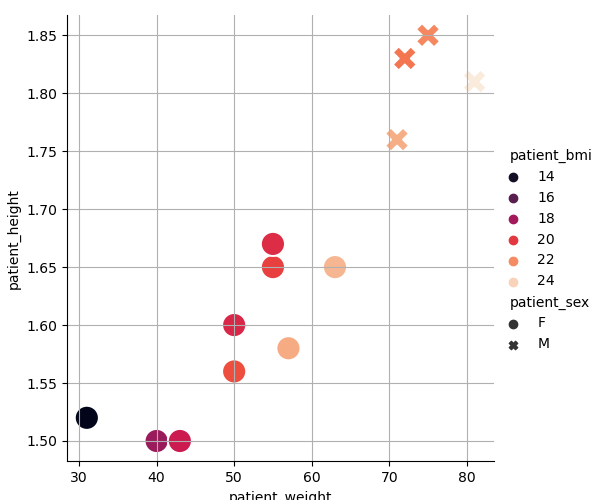

Mean weight = 57.15kgs +/-14.79 
Mean height = 1.65m +/-0.13 
Mean BMI = 20.56 +/-2.89 
Sex = M(4) F(9)


In [31]:
df = df_sc.loc[(df_sc["pass"] == 1)]

g = sns.relplot(x="patient_weight", y="patient_height", hue="patient_bmi", palette=cm, style="patient_sex", style_order=['F', 'M'],
                s=300, data=df)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

print("Mean weight = %.2fkgs +/-%.2f " % (df["patient_weight"].mean(),
                                          df["patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["patient_height"].mean(),
                                        df["patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f " % (df["patient_bmi"].mean(), 
                                    df["patient_bmi"].std()))

sex_counts = df["patient_sex"].value_counts()
print("Sex = M(%d) F(%d)" % (sex_counts["M"], sex_counts["F"]))


Well ok, the cohort is not super... A lot of women, small and thin. :s

## $B_1$ power (ref. voltage) & BMI
Do we have a dependence between reference voltage and BMI?

<IPython.core.display.Javascript object>


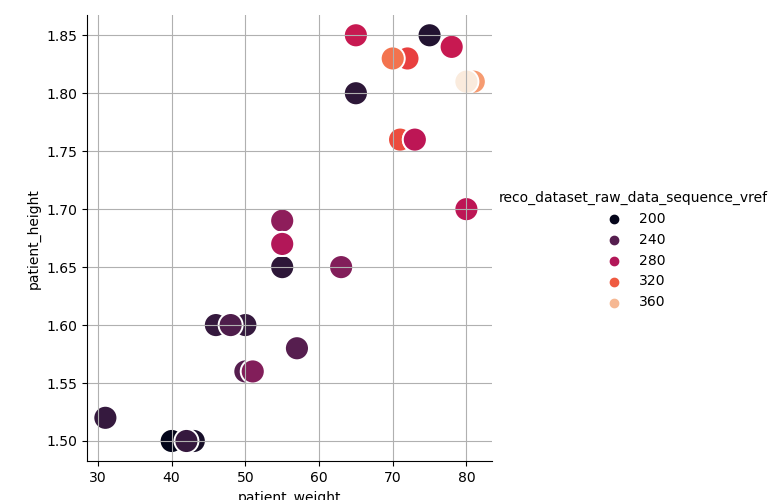

<IPython.core.display.Javascript object>


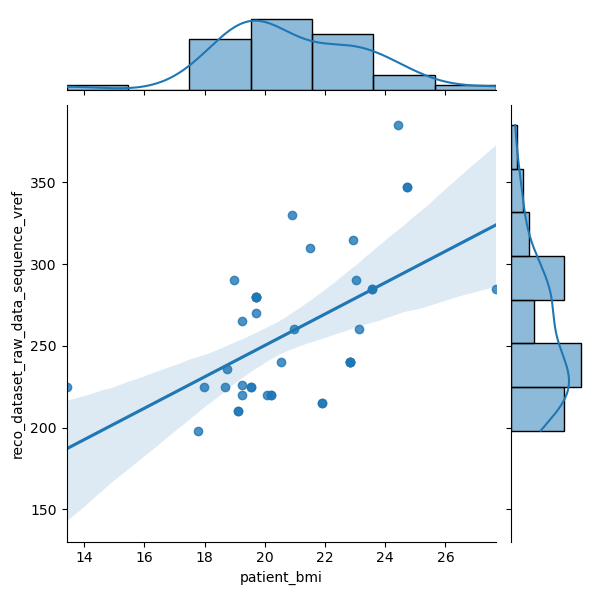

R = 0.55


In [32]:
df = df_sc_all_slaser

x = df["patient_weight"]
y = df["patient_height"]
z = df["reco_dataset_raw_data_sequence_vref"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["patient_bmi"]
y = df["reco_dataset_raw_data_sequence_vref"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Like for SC imaging, there is here a "strong" correlation between Vref and BMI/BFP.

## Voxel position & BMI
Does the voxel position change with BMI?

<IPython.core.display.Javascript object>


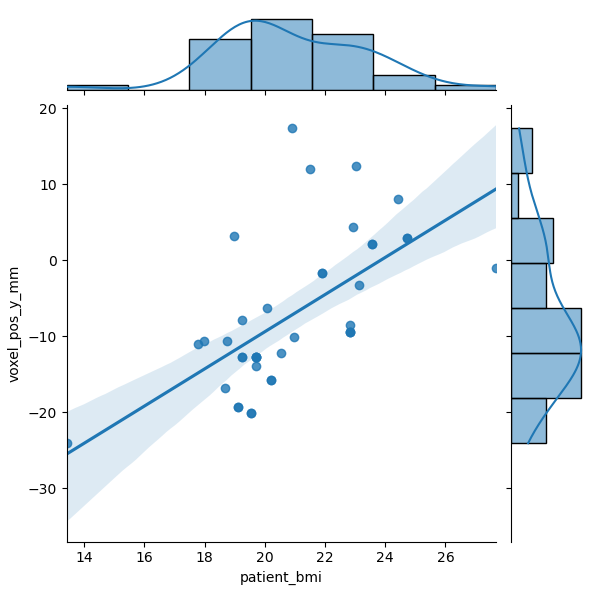

R = 0.63


In [33]:
df = df_sc_all_slaser

x = df["patient_bmi"]
y = -df["voxel_pos_y_mm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

The voxel position in Y is nicely correlated with BMI. The bigger you are, the higher will the voxel and therefore the further a way from the coil...

# General data quality

## SNR & LW vs. BMI

<IPython.core.display.Javascript object>


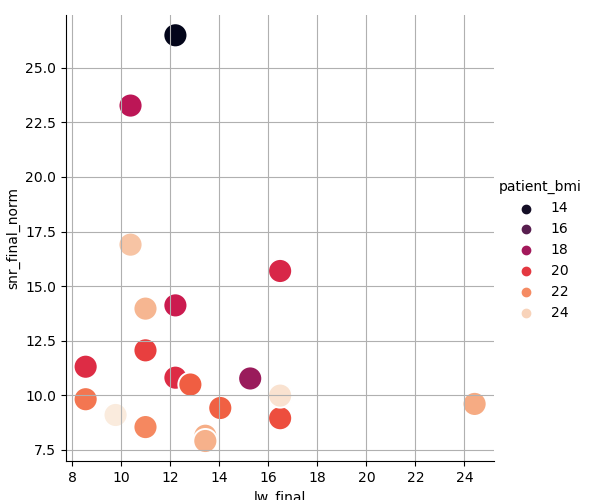

<IPython.core.display.Javascript object>


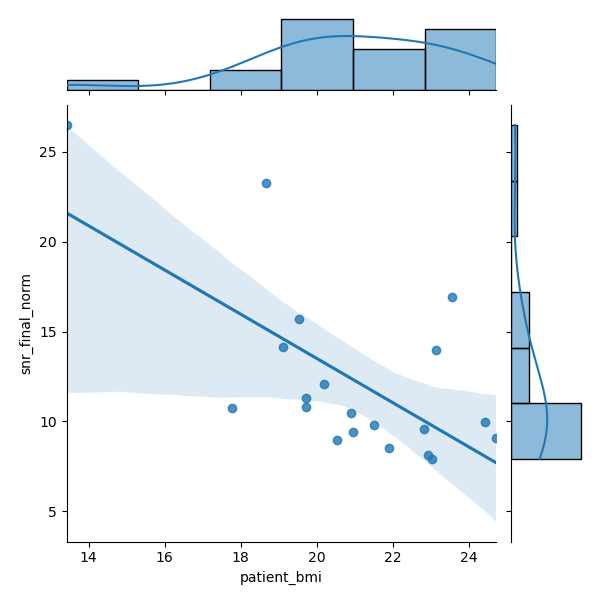

R = -0.65


In [34]:
df = df_sc

g = sns.relplot(x="lw_final", y="snr_final_norm", hue="patient_bmi", palette=cm, s=300, data=df)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

# only SNR
x = df["patient_bmi"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


## SNR vs. voxel position (BMI)

There could be some slight SNR dependance with BMI...

SNR is normalized by:
* voxel position in Y

Therefore
* SNR values are multiplied by $(1+\frac{y^2}{R^2})^{\frac{2}{3}}$ and multiplied by $(1+\frac{y_{mean}^2}{R^2})^{\frac{2}{3}}$

According to the Biot–Savart law (Jackson, 1975), cited in https://doi.org/10.1201/9781315107325, the distance relative to the RF loop surface coil impacts SNR with a $(1+\frac{y^2}{R^2})^{\frac{2}{3}}$ term. $y$ is the absolute distance between the voxel and the RF coil, $R$ is the coil radius. $y_{mean}$ is the average $y$ position over the whole group.

The problem is to evaluate this absolute distance to coil when I only know the voxel position relative to the magnet center... Let's take the lowest voxel position in the study group, probably for the thinnest subject and consider that we were 4cm away from the coil.

Ok, another problem is that we were using a multi-channel Rx spinal cord coil. What do I put for the radius? Assuing a 14cm radius coil... Big approximation.

<IPython.core.display.Javascript object>


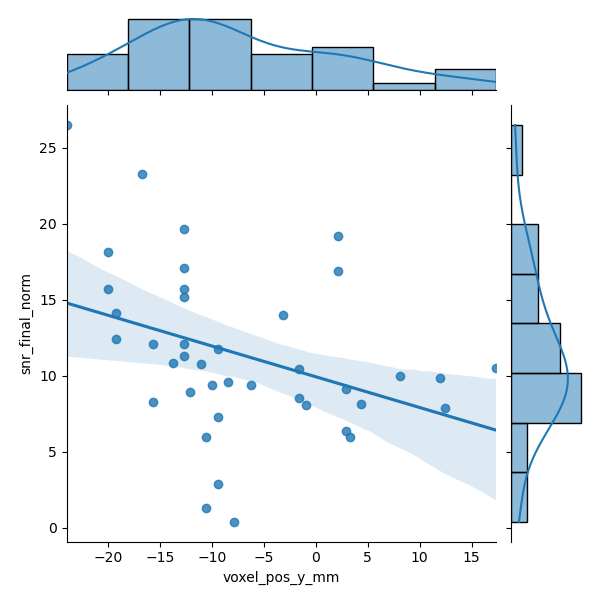

R = -0.37


/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

<IPython.core.display.Javascript object>


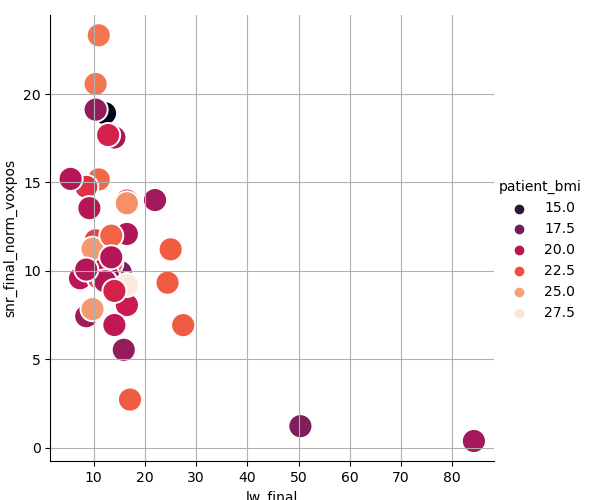

<IPython.core.display.Javascript object>


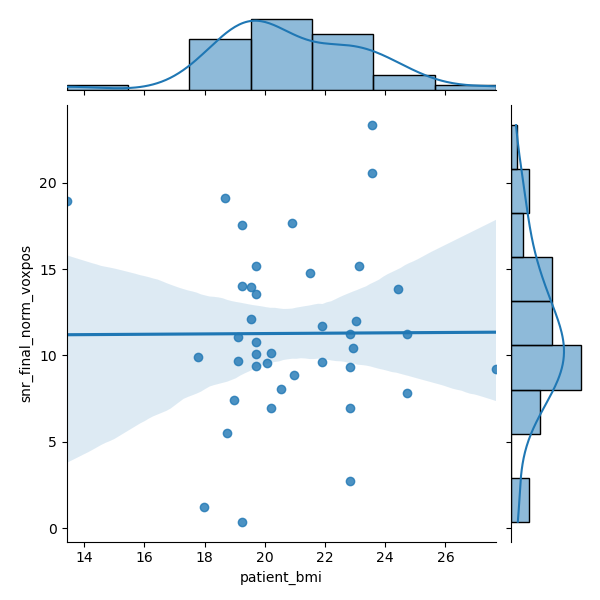

R = 0.01


In [35]:
df = df_sc_all_slaser

# does the Y position has an effect on SNR?
x = -df["voxel_pos_y_mm"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

# Y voxel position normalization
min_dist_voxel_coil_mm = 40.0  # mm
coil_radius_mm = 140.0 / 2  # mm 
# looking for minimum Y position
max_pos = np.max(df["voxel_pos_y_mm"])
df["voxel_pos_y_mm_abs"] = -(df["voxel_pos_y_mm"] - max_pos) + min_dist_voxel_coil_mm
mean_abs_y_pos = df["voxel_pos_y_mm_abs"].mean()
# normalization
df["snr_final_norm_voxpos"] = df["snr_final_norm"] * np.power(1 + np.power(df["voxel_pos_y_mm_abs"], 2) / np.power(coil_radius_mm, 2), 3/2)
df["snr_final_norm_voxpos"] = df["snr_final_norm_voxpos"] / np.power(1 + np.power(mean_abs_y_pos, 2) / np.power(coil_radius_mm, 2), 3/2)

x = df["lw_final"]
y = df["snr_final_norm_voxpos"]
z = df["patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

# only SNR
x = df["patient_bmi"]
y = df["snr_final_norm_voxpos"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

No more correlation in those last plots? Because we corected the SNR change due to voxel Y position.

To conclude, SNR is dependant on a few things:
* Of course, NA and voxel size
* But also Y voxel position and there those patient weight/height/BMI/BFP

# Signal stability, data quality vs. rejection

## SNR vs. signal stability
Before performing data rejection, the time evolution of the water peak amplitude, linewidth, chemical shift and phase are estimated. In a way, those estimations reflect signal stability or instability (due to physio motion). Could it affect the SNR?

<IPython.core.display.Javascript object>


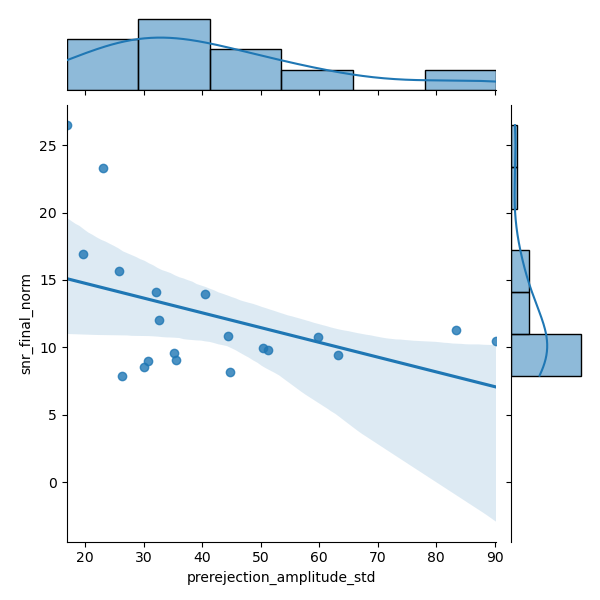

R = -0.44


<IPython.core.display.Javascript object>


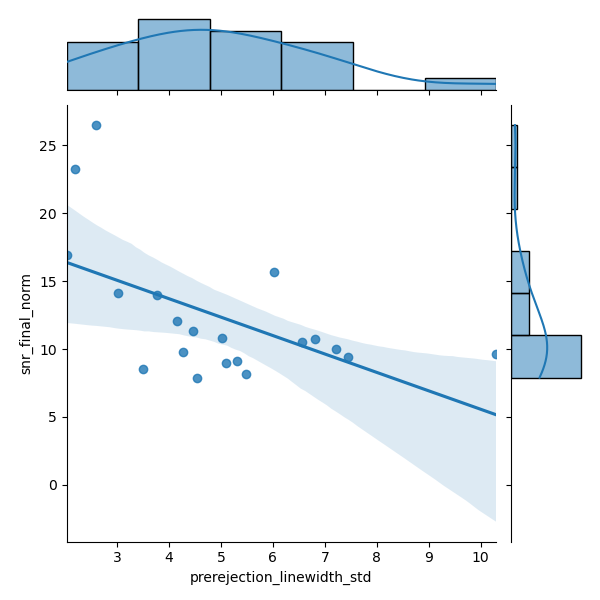

R = -0.55


<IPython.core.display.Javascript object>


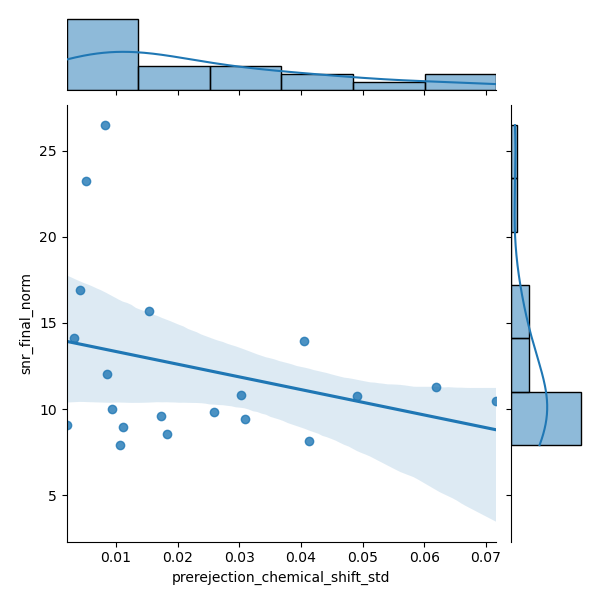

R = -0.30


<IPython.core.display.Javascript object>


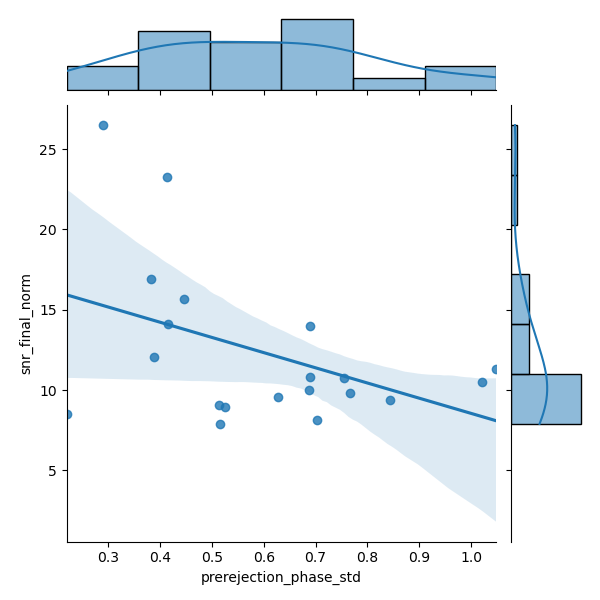

R = -0.43


In [36]:
df = df_sc

x = df["prerejection_amplitude_std"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_linewidth_std"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_chemical_shift_std"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_phase_std"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nice results but not very significant...
SNR increases if the acquired signal is stable in terms of amplitude, linewidth, chemical shift and phase

## Data rejection vs. signal stability

<IPython.core.display.Javascript object>


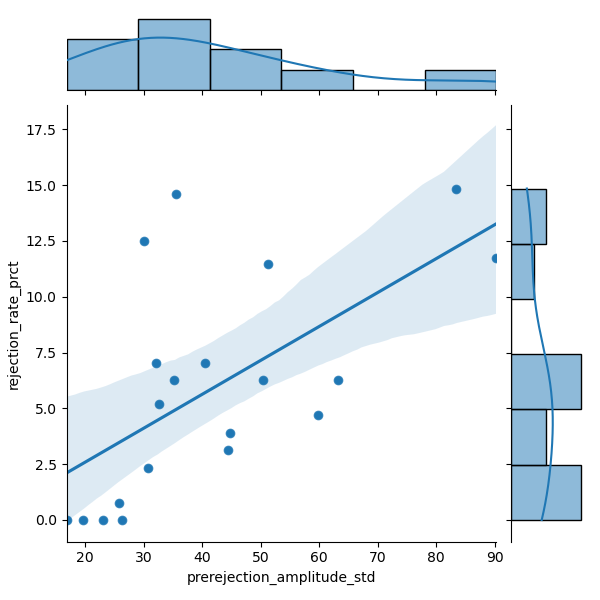

R = 0.62


<IPython.core.display.Javascript object>


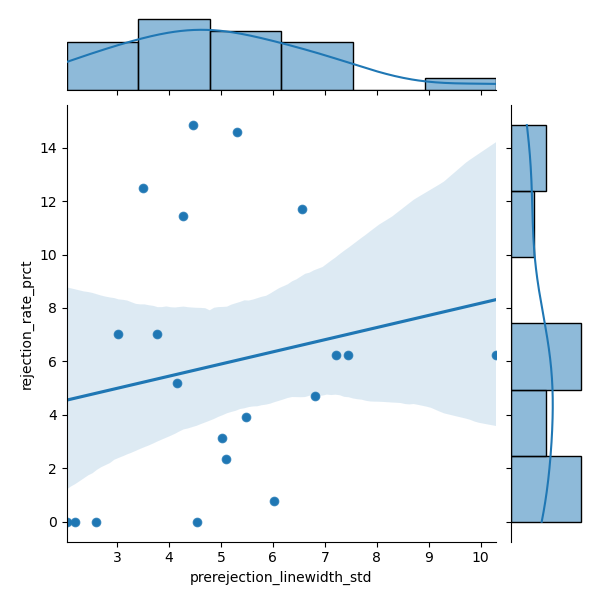

R = 0.19


<IPython.core.display.Javascript object>


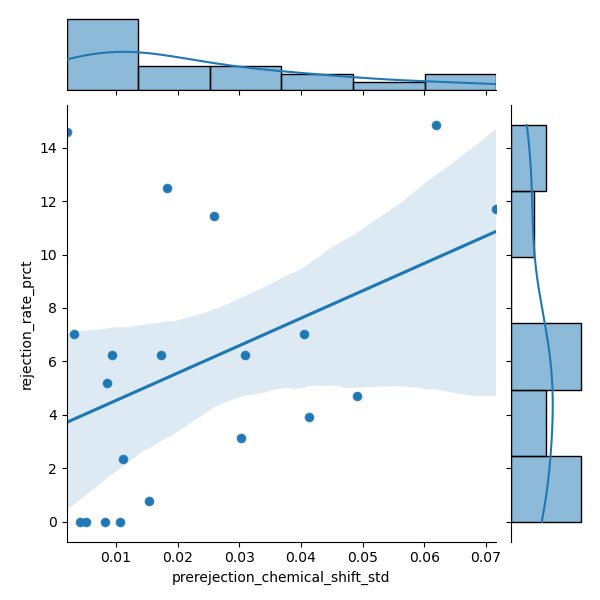

R = 0.42


<IPython.core.display.Javascript object>


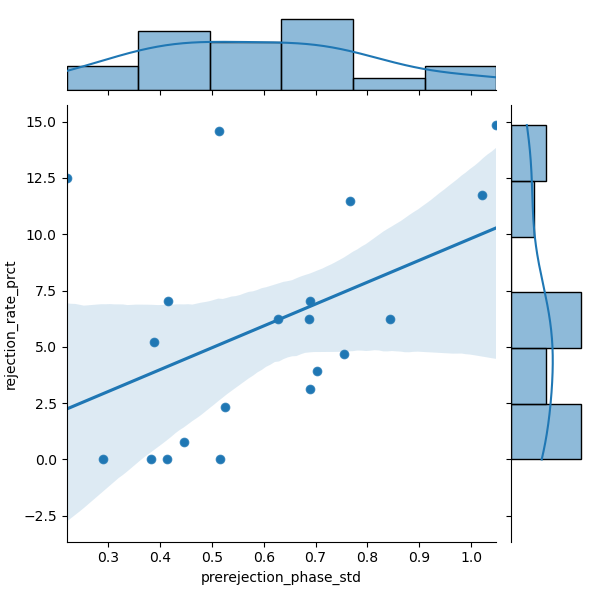

R = 0.45


In [37]:
df = df_sc

x = df["prerejection_amplitude_std"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_linewidth_std"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_chemical_shift_std"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["prerejection_phase_std"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Interesting but not super significant, as usual. The amount of data we rejected during reconstruction depends on the signal stability (amplitude, **linewidth**, chemical shift and phase).

## Data rejection rate vs. acquisition time

<IPython.core.display.Javascript object>


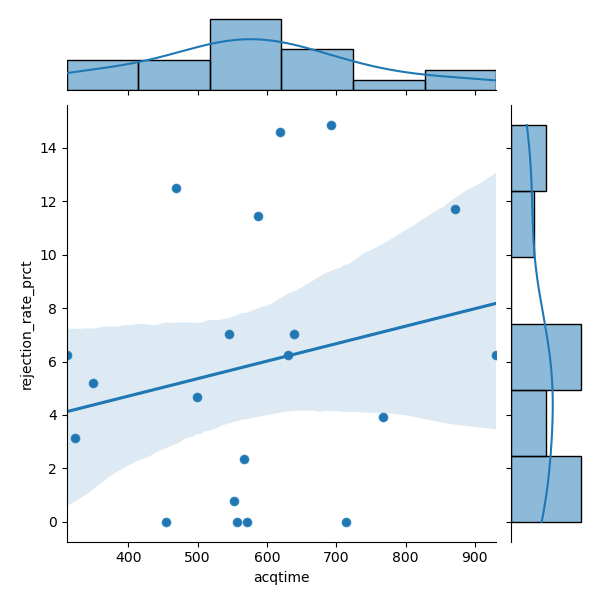

R = 0.22


<IPython.core.display.Javascript object>


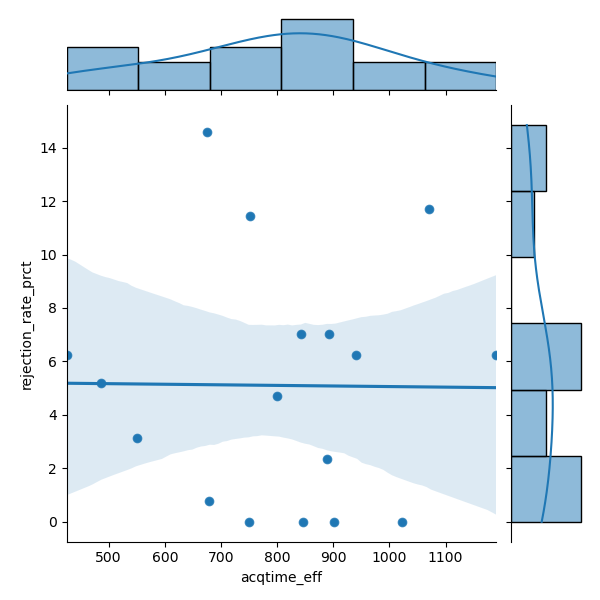

R = -0.01


In [38]:
df = df_sc

x = df["acqtime"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["acqtime_eff"]
y = df["rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Interesting but not super significant, as usual. The amount of data we rejected during reconstruction depends on the acquisition time (the longer you scan, the higher the probability to have some motion).

## Signal stability vs. heart beat
What about physio motion like heart and respiration? It should be reflected in the signal instabilities...

<IPython.core.display.Javascript object>


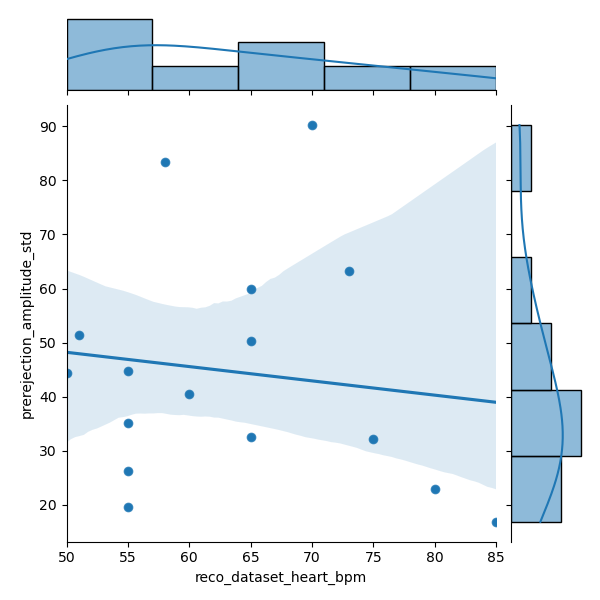

R = -0.13


<IPython.core.display.Javascript object>


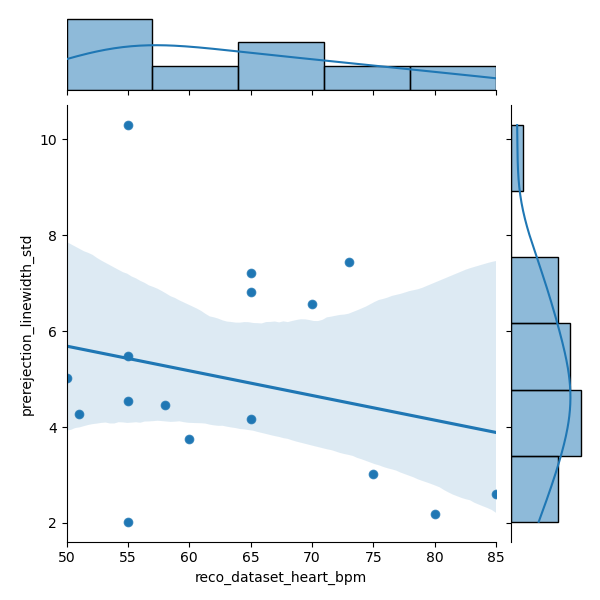

R = -0.24


<IPython.core.display.Javascript object>


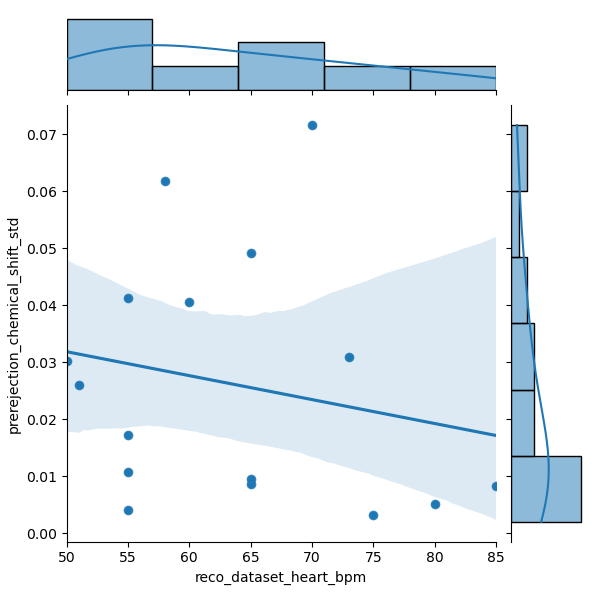

R = -0.21


<IPython.core.display.Javascript object>


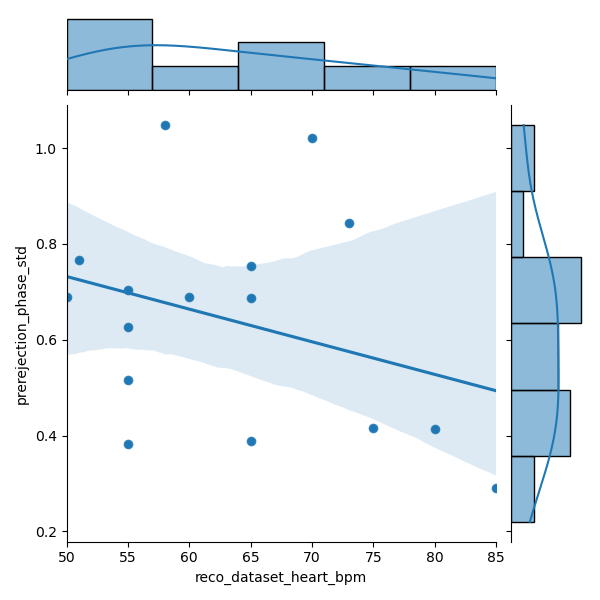

R = -0.32


In [39]:
df = df_sc

x = df["reco_dataset_heart_bpm"].astype(float)
y = df["prerejection_amplitude_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_heart_bpm"].astype(float)
y = df["prerejection_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_heart_bpm"].astype(float)
y = df["prerejection_chemical_shift_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_heart_bpm"].astype(float)
y = df["prerejection_phase_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Well, heart beat has apparently no influence on signal stability and therefore on our MRS data quality...

## Signal stability vs. respiration
Maybe respiration does explain the differences in signal stability between subjects?

<IPython.core.display.Javascript object>


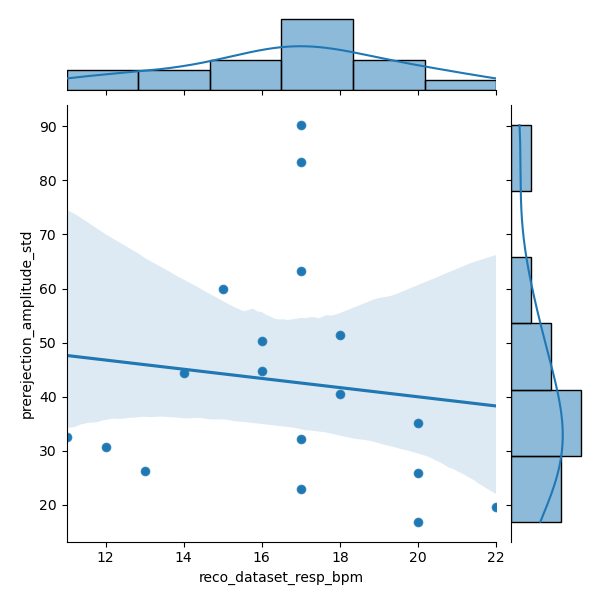

R = -0.12


<IPython.core.display.Javascript object>


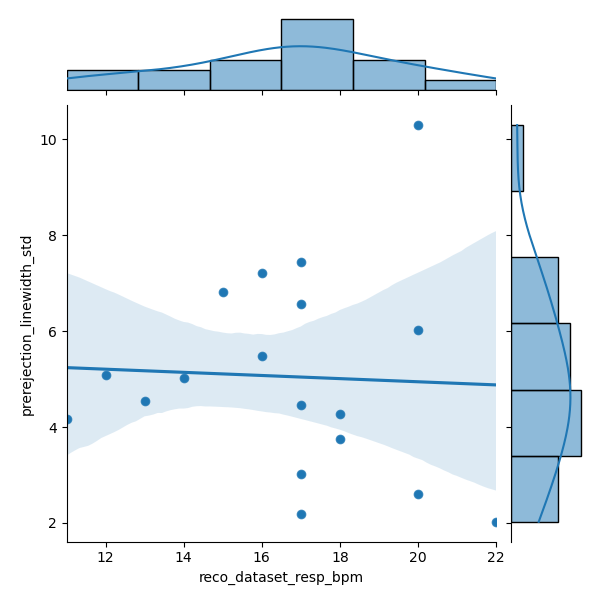

R = -0.05


<IPython.core.display.Javascript object>


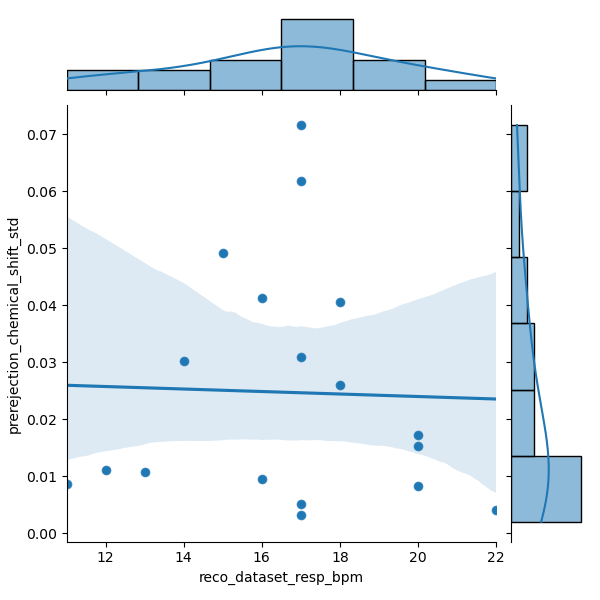

R = -0.03


<IPython.core.display.Javascript object>


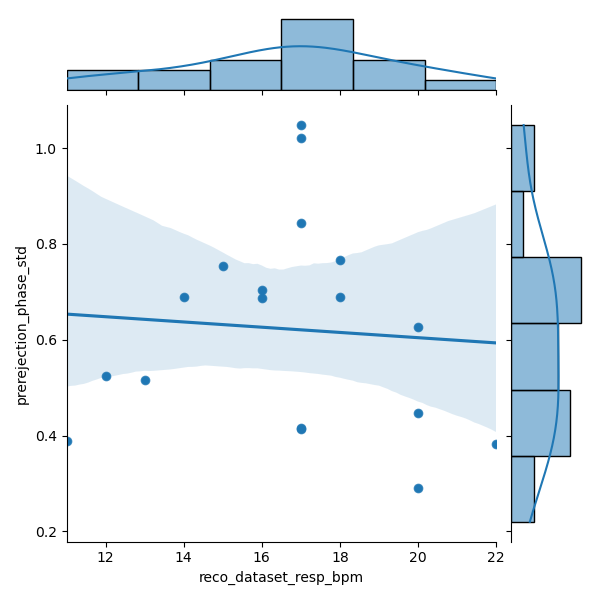

R = -0.07


In [40]:
df = df_sc

x = df["reco_dataset_resp_bpm"].astype(float)
y = df["prerejection_amplitude_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_resp_bpm"].astype(float)
y = df["prerejection_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_resp_bpm"].astype(float)
y = df["prerejection_chemical_shift_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_resp_bpm"].astype(float)
y = df["prerejection_phase_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nope, does not make any sense.

# Cord curvyness

## Extract voxel rotation angle

In [41]:
from suspect.io.siemens import read_csa_header, rotation_matrix
import pydicom.dicomio

def add_voxel_angle(this_df):
    
    for this_index, this_row in this_df.iterrows():
        dsf = this_row["reco_dataset_dcm_files"][0]
        if(not dsf.endswith(".dcm")):
            dsf = dsf + "/original-primary_e09_0001.dcm"
        dataset = pydicom.dicomio.read_file(dsf)

        # now look through the tags (0029, 00xx) to work out which xx refers to the csa header
        # xx seems to start at 10 for Siemens
        xx = 0x0010
        header_index = 0
        while (0x0029, xx) in dataset:
            if dataset[0x0029, xx].value == "SIEMENS CSA HEADER":
                header_index = xx
            xx += 1
        # check that we have found the header
        if header_index == 0:
            raise KeyError("Could not find header index")
        # now we know which tag contains the CSA image header info: (0029, xx10)
        csa_header_bytes = dataset[0x0029, 0x0100 * header_index + 0x0010].value
        csa_header = read_csa_header(csa_header_bytes)
        in_plane_rot = csa_header["VoiInPlaneRotation"]
        normal_vector = csa_header["VoiOrientation"]
        rot_matrix = rotation_matrix(in_plane_rot, normal_vector)

        rot_matrix = np.array(rot_matrix)
        tetax_deg = np.arctan2(rot_matrix[3-1][2-1], rot_matrix[3-1][3-1]) * 180 / np.pi
        tetay_deg = np.arctan2(-rot_matrix[3-1][1-1], np.sqrt( rot_matrix[3-1][2-1]**2 + rot_matrix[3-1][3-1]**2)) * 180 / np.pi
        tetaz_deg = np.arctan2(rot_matrix[2-1][1-1], rot_matrix[1-1][1-1]) * 180 / np.pi

        print("VoiInPlaneRotation (deg) = %.2f" % (in_plane_rot * 180 / np.pi))
        print("X (deg) = %.2f" % tetax_deg)
        print("Y (deg) = %.2f" % tetay_deg)
        print("Z (deg) = %.2f" % tetaz_deg)
        print()

        
        # store in df
        this_df.at[this_index, "voxel_angle_max_deg"] = max(np.abs([tetax_deg, tetay_deg, tetaz_deg]))
 
    return(this_df)

df_sc = add_voxel_angle(df_sc)
df_sc_all_slaser = add_voxel_angle(df_sc_all_slaser)


VoiInPlaneRotation (deg) = -0.11
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = -0.11

VoiInPlaneRotation (deg) = -0.21
X (deg) = 0.00
Y (deg) = 0.07
Z (deg) = -0.20

VoiInPlaneRotation (deg) = 0.07
X (deg) = 0.00
Y (deg) = -0.01
Z (deg) = 0.07

VoiInPlaneRotation (deg) = -0.17
X (deg) = -0.00
Y (deg) = -0.01
Z (deg) = -0.17

VoiInPlaneRotation (deg) = 0.46
X (deg) = -0.02
Y (deg) = -0.07
Z (deg) = 0.45

VoiInPlaneRotation (deg) = -4.70
X (deg) = -4.70
Y (deg) = 0.02
Z (deg) = 0.00

VoiInPlaneRotation (deg) = -4.38
X (deg) = -4.38
Y (deg) = 0.01
Z (deg) = 0.00

VoiInPlaneRotation (deg) = -6.29
X (deg) = -6.29
Y (deg) = -0.02
Z (deg) = -0.00

VoiInPlaneRotation (deg) = 0.09
X (deg) = -0.00
Y (deg) = -0.01
Z (deg) = 0.09

VoiInPlaneRotation (deg) = 0.13
X (deg) = -0.00
Y (deg) = -0.02
Z (deg) = 0.13

VoiInPlaneRotation (deg) = -0.34
X (deg) = -0.00
Y (deg) = 0.08
Z (deg) = -0.33

VoiInPlaneRotation (deg) = 0.17
X (deg) = -0.00
Y (deg) = -0.03
Z (deg) = 0.17



/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


VoiInPlaneRotation (deg) = 0.00
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = 0.00

VoiInPlaneRotation (deg) = 0.06
X (deg) = 0.00
Y (deg) = -0.01
Z (deg) = 0.06

VoiInPlaneRotation (deg) = -0.02
X (deg) = -0.00
Y (deg) = -0.00
Z (deg) = -0.02

VoiInPlaneRotation (deg) = -0.02
X (deg) = 0.00
Y (deg) = 0.00
Z (deg) = -0.02

VoiInPlaneRotation (deg) = 0.00
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = 0.00

VoiInPlaneRotation (deg) = 0.06
X (deg) = -0.00
Y (deg) = -0.02
Z (deg) = 0.06

VoiInPlaneRotation (deg) = 0.53
X (deg) = -0.00
Y (deg) = -0.12
Z (deg) = 0.52

VoiInPlaneRotation (deg) = 0.02
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = 0.02

VoiInPlaneRotation (deg) = -0.02
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = -0.02

VoiInPlaneRotation (deg) = -0.11
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = -0.11

VoiInPlaneRotation (deg) = -0.11
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = -0.11

VoiInPlaneRotation (deg) = -0.02
X (deg) = -0.00
Y (deg) = -0.00
Z (deg) = -0.02

VoiInPlaneRotation (deg) = -0.21
X (d

## SNR vs. voxel rotation
and indirectly spinal cord curve

<IPython.core.display.Javascript object>


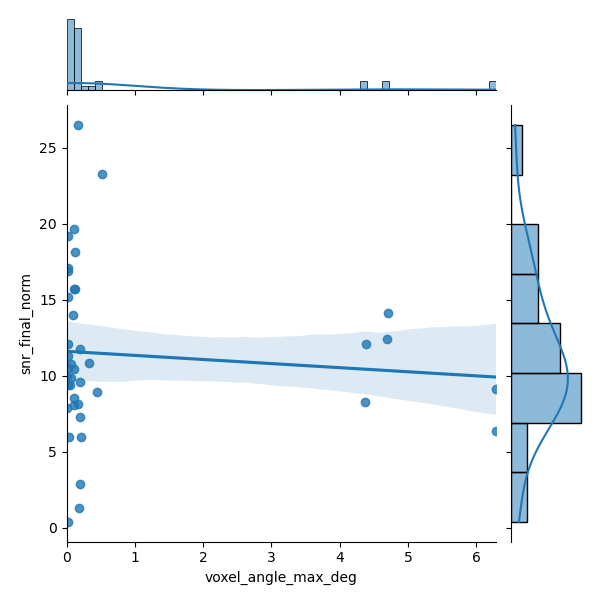

R = -0.09


In [42]:
df = df_sc_all_slaser

x = df["voxel_angle_max_deg"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nothing intesting, voxel rotation does not impact SNR.

## Extract T2w images
To check visually the cord curve

296_P1
/home/tangir/crmbm/acq/296_ym_p1_brainmoelle/296-ym-p1-brainmoelle/20190626/02_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


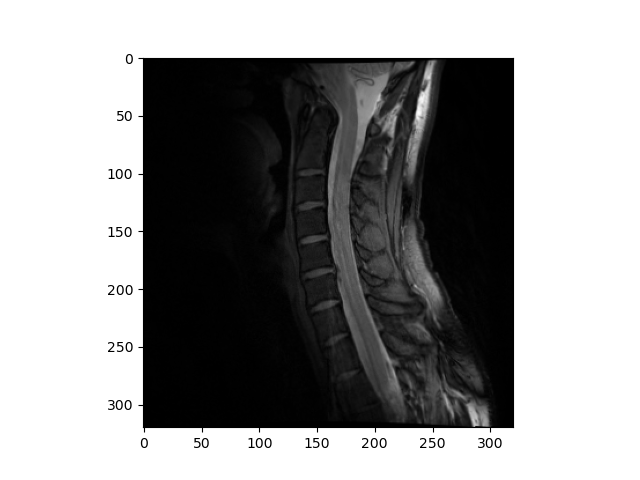

300_P1
/home/tangir/crmbm/acq/300-pm-p1-moelle/20190716/01_0003_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


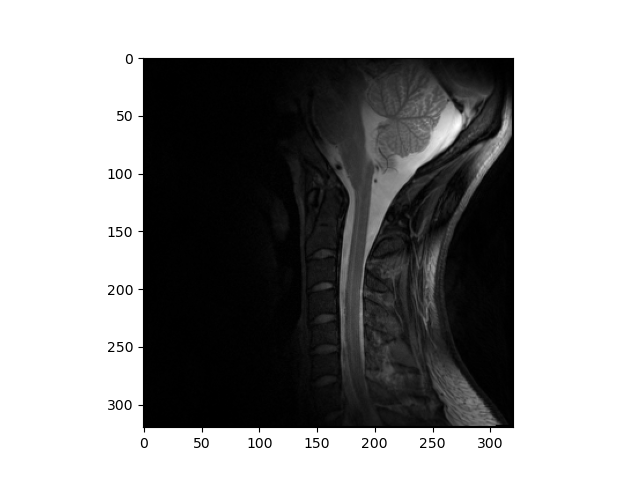

300_P1
/home/tangir/crmbm/acq/300-pm-p1-moelle/20190716/01_0003_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


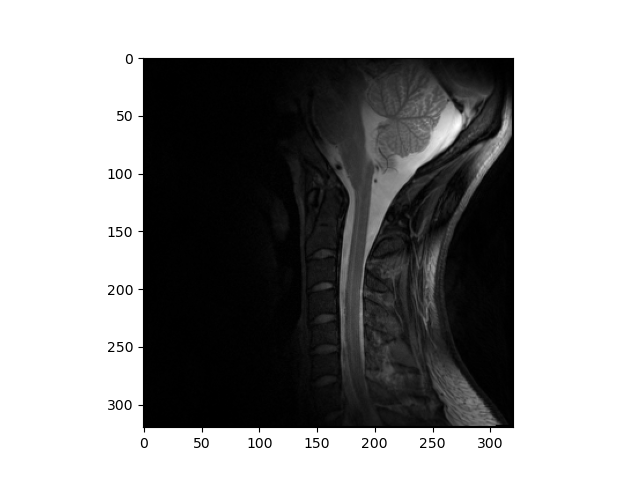

304_P1
/home/tangir/crmbm/acq/304-ka-p1-moelle/20190814/01_0010_t2-tse-sag-2d-5sl-p2-trig-s9-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


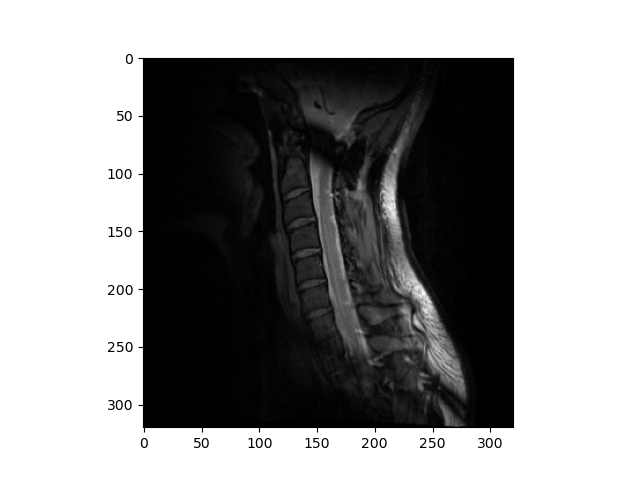

307_P1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


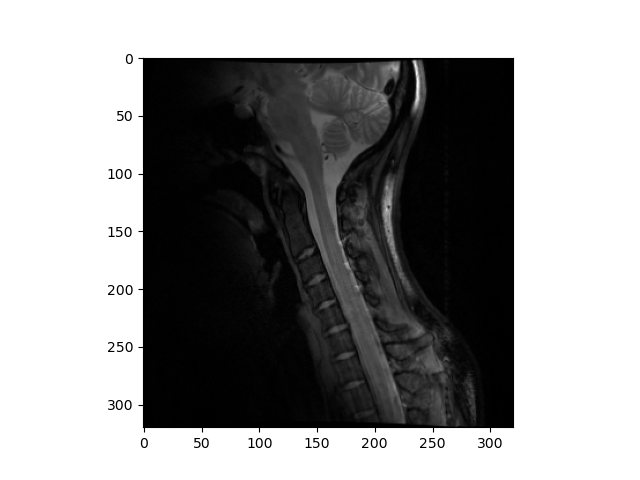

307_P1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


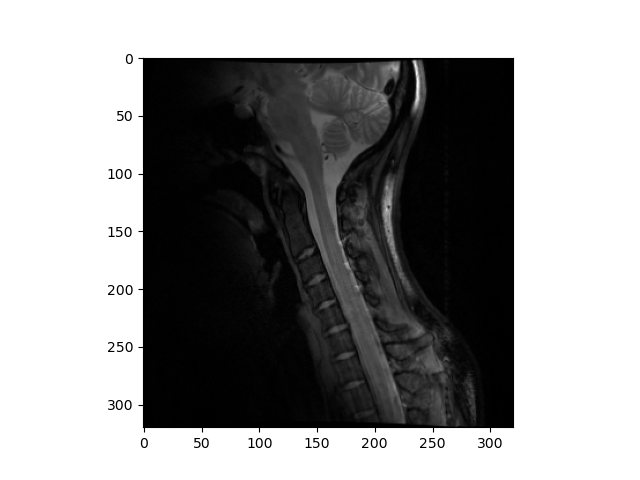

307_P1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


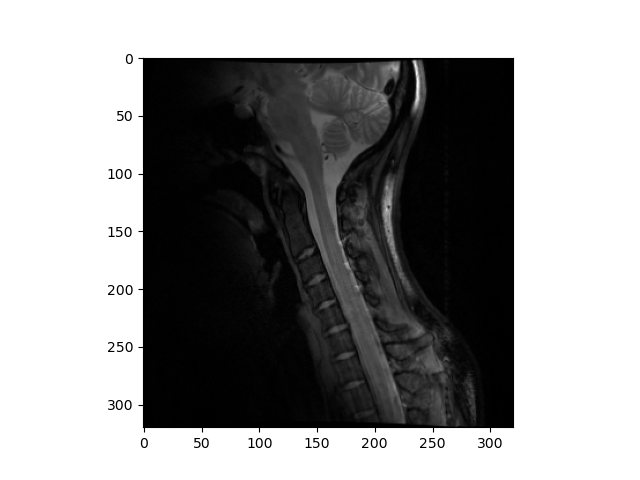

307_P1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


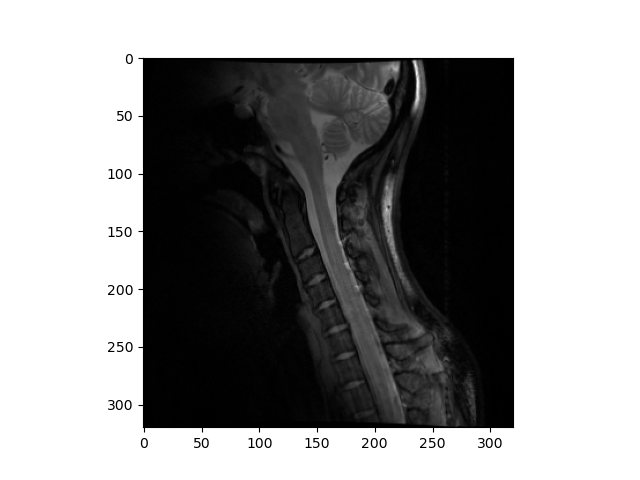

308_P1
/home/tangir/crmbm/acq/308-rs-p1-moelle/20190827/01_0005_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


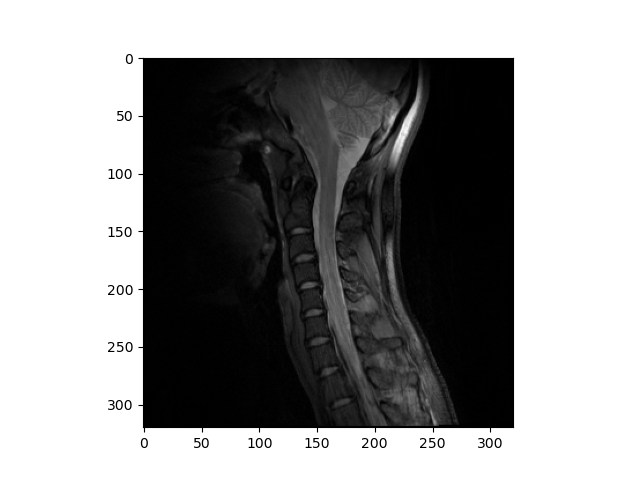

310_P1
/home/tangir/crmbm/acq/310-mg-p1-moelle/20190829/01_0004_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


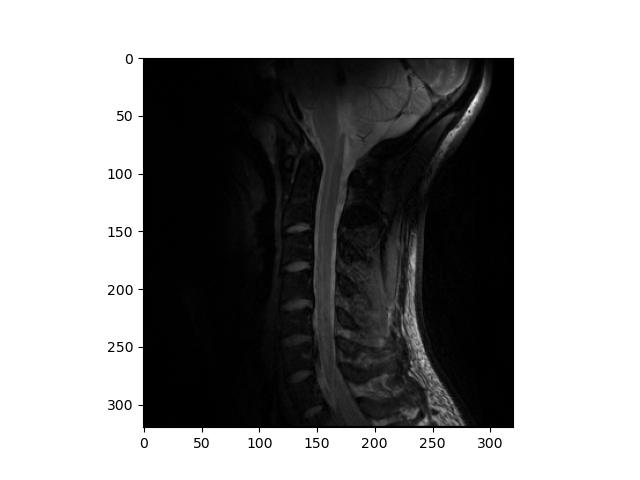

311_P1
/home/tangir/crmbm/acq/311-sl-p1-moelle/20190905/01_0033_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


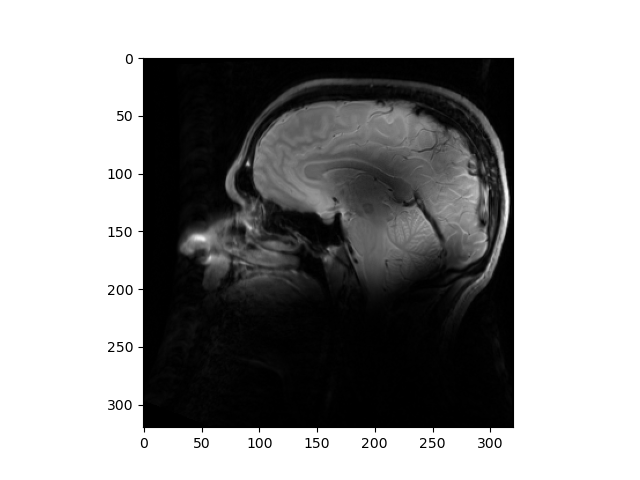

313_P1
/home/tangir/crmbm/acq/313-ft-p1-moelle/20190923/01_0012_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>

314_P1
/home/tangir/crmbm/acq/314-yt-p1-moelle/20190925/01_0006_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


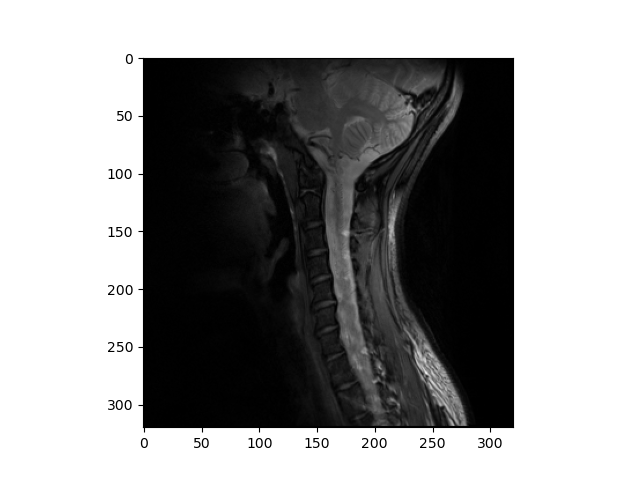

314_P1
/home/tangir/crmbm/acq/314-yt-p1-moelle/20190925/01_0006_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>

316_P1
/home/tangir/crmbm/acq/316-ap-p1-moelle/20191003/01_0014_t2-tse-sag-2d-5sl-p2-trig-s13-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


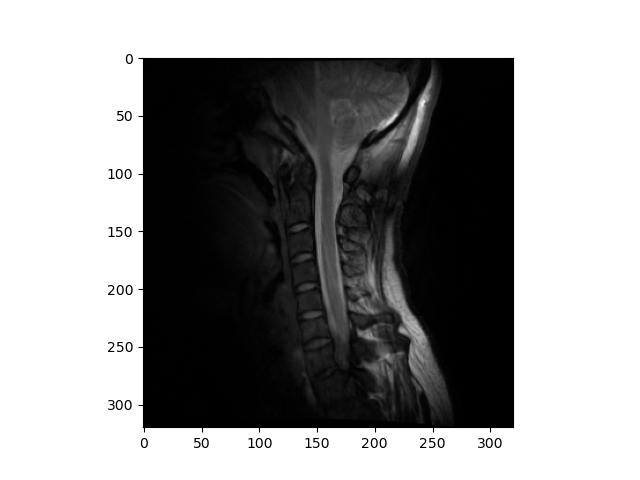

316_P1
/home/tangir/crmbm/acq/316-ap-p1-moelle/20191003/01_0014_t2-tse-sag-2d-5sl-p2-trig-s13-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


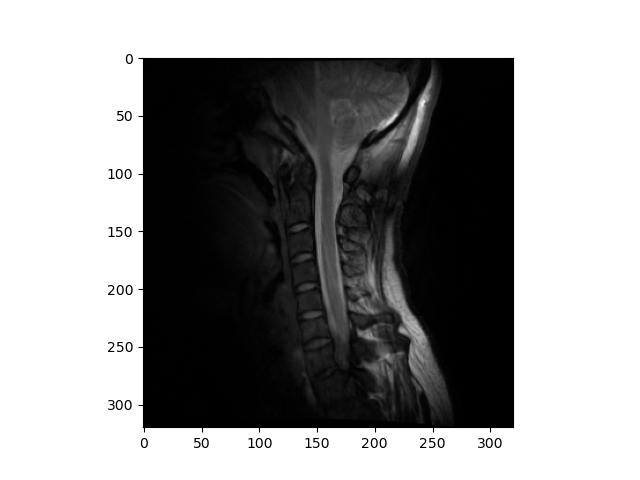

319_P1
/home/tangir/crmbm/acq/319-fc-p1-moelle/20191017/01_0010_t2-tse-sag-2d-5sl-p2-trig-s9-nd/original-primary-m-norm-nd_e01_0001.dcm


<IPython.core.display.Javascript object>


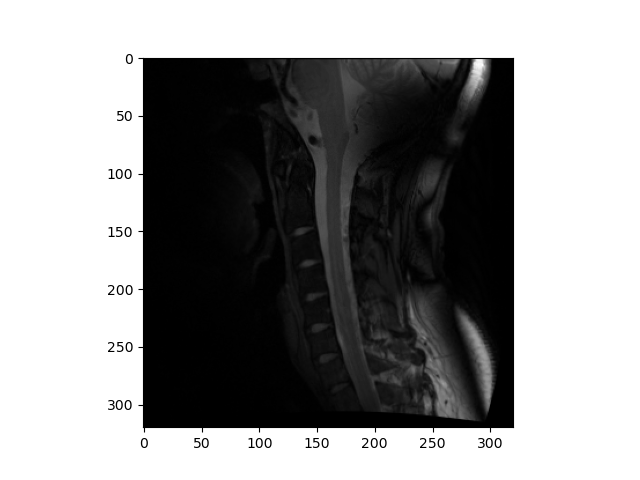

319_P1
/home/tangir/crmbm/acq/319-fc-p1-moelle/20191017/01_0010_t2-tse-sag-2d-5sl-p2-trig-s9-nd/original-primary-m-norm-nd_e01_0001.dcm


<IPython.core.display.Javascript object>


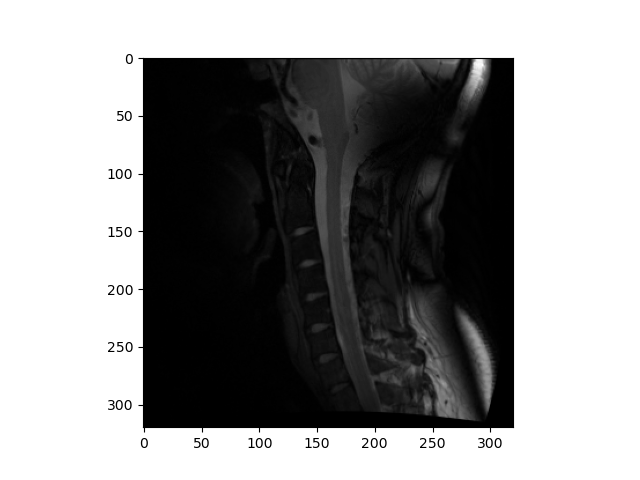

328_P1
/home/tangir/crmbm/acq/328-af-p1-moelle/20191105/01_0010_t2-tse-sag-2d-5sl-p2-trig-s9-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

329_P1
/home/tangir/crmbm/acq/329-pi-p1-moelle/20191108/01_0014_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>

329_P1
/home/tangir/crmbm/acq/329-pi-p1-moelle/20191108/01_0014_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>

333_P1
/home/tangir/crmbm/acq/333-sc-p1-moelle/20191126/01_0006_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


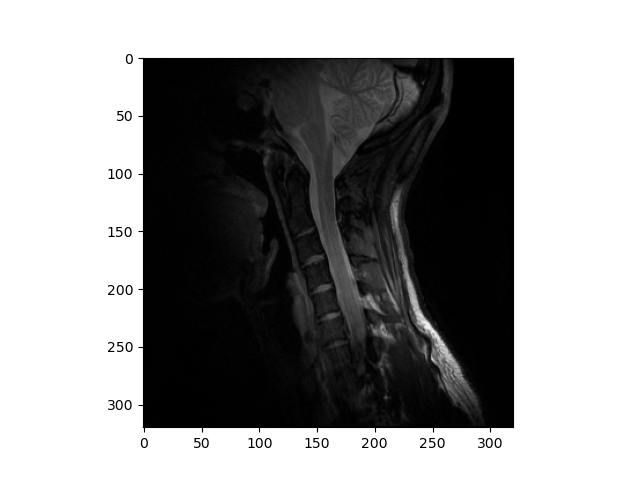

336_P1
/home/tangir/crmbm/acq/336-nb-p1-moelle/20191209/01_0004_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0002.dcm


<IPython.core.display.Javascript object>


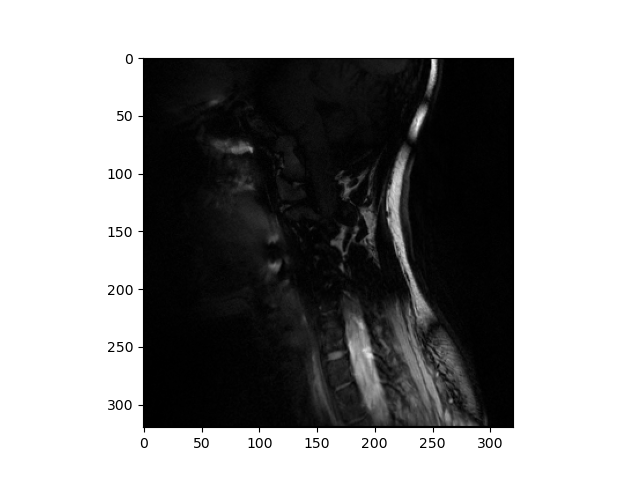

338_P1
/home/tangir/crmbm/acq/338-ro-p1-moelle/20191210/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


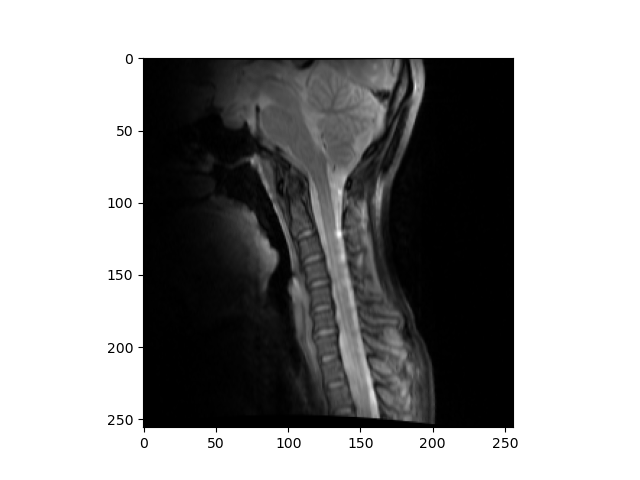

300_P2
/home/tangir/crmbm/acq/300-pm-p2-moelle/20200128/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


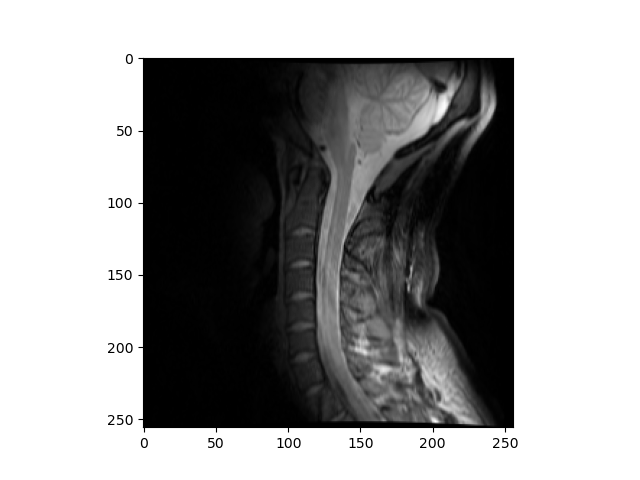

349_P1
/home/tangir/crmbm/acq/349-ap-p1-moelle/20200206/01_0003_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0009.dcm


<IPython.core.display.Javascript object>

355_P1
/home/tangir/crmbm/acq/355-st-p1-moelle/20200224/01_0007_t2-tse-sag-2d-10sl-p2-trig-s6-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>

304_P2
/home/tangir/crmbm/acq/304-ka-p2-moelle/20200304/01_0003_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0009.dcm


<IPython.core.display.Javascript object>

304_P2
/home/tangir/crmbm/acq/304-ka-p2-moelle/20200304/01_0003_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0009.dcm


<IPython.core.display.Javascript object>

311_P2
/home/tangir/crmbm/acq/311-sl-p2-moelle/20200529/01_0014_t2-tse-sag-2d-10sl-p2-trig-s13-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


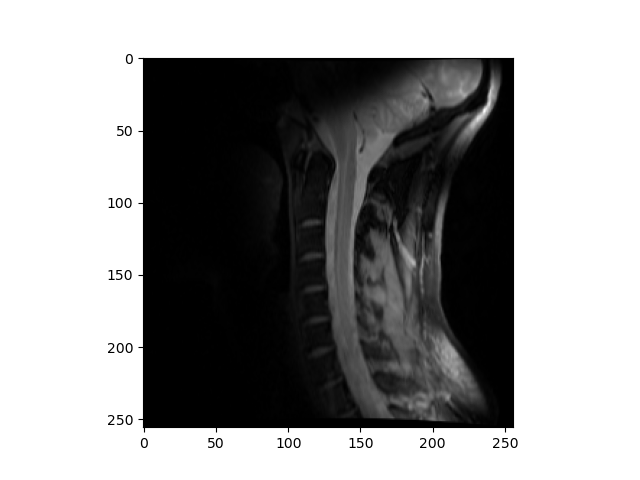

311_P2
/home/tangir/crmbm/acq/311-sl-p2-moelle/20200529/01_0014_t2-tse-sag-2d-10sl-p2-trig-s13-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


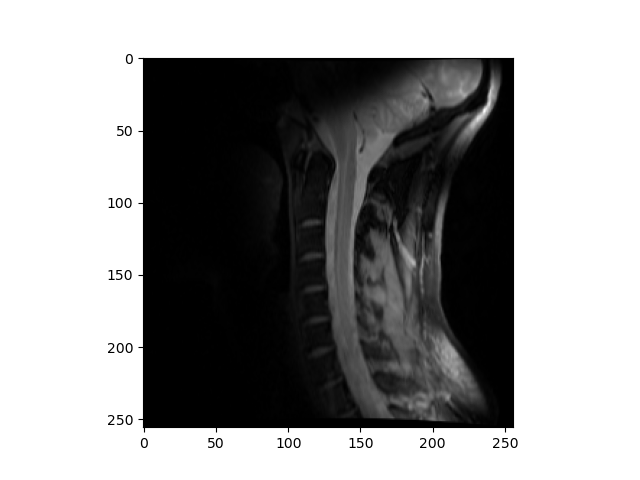

336_P2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0007_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


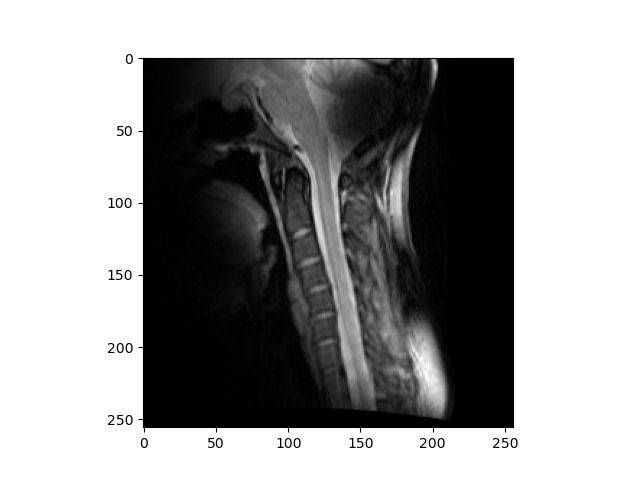

336_P2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0007_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


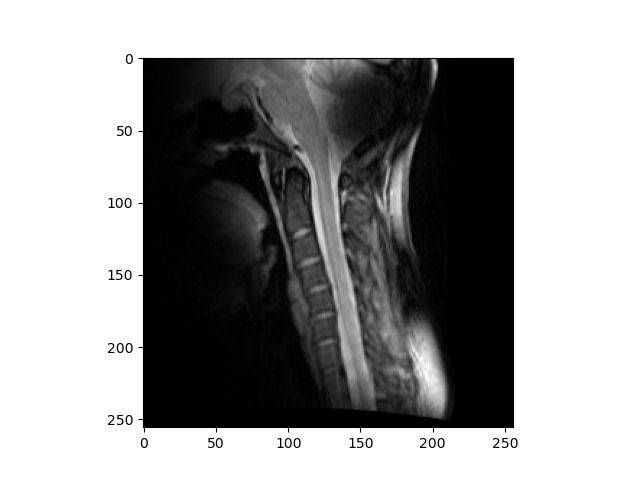

336_P2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0007_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>

336_P2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0007_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>

319_P2
/home/tangir/crmbm/acq/319-fc-p2-moelle/20200611/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>

313_P2
/home/tangir/crmbm/acq/313-ft-p2-moelle/20200615/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>

333_P2
/home/tangir/crmbm/acq/333-sc-p2-moelle/20200619/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


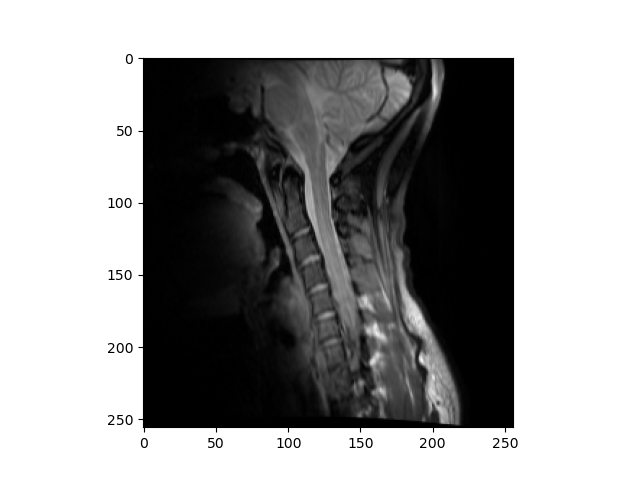

314_P2
/home/tangir/crmbm/acq/314-yt-p2-moelle/20200625/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0006.dcm


<IPython.core.display.Javascript object>


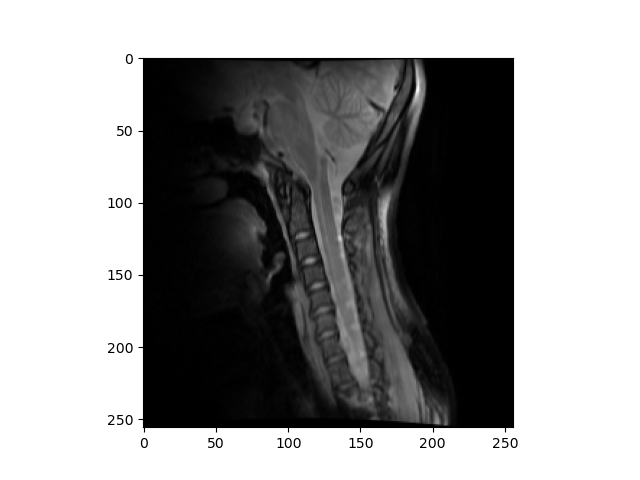

349_P2
/home/tangir/crmbm/acq/349-ap-p2-moelle/20200925/01_0011_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0008.dcm


<IPython.core.display.Javascript object>

In [43]:
import os

this_df = df_sc_all_slaser

for this_index, this_row in this_df.iterrows():
    
    # path to sLASER dcm file
    dsf = this_row["reco_dataset_dcm_files"][0]
    if(not dsf.endswith(".dcm")):
        dsf = dsf + "/original-primary_e09_0001.dcm"
        
    # get patient folder
    dsf_splitted = os.path.split(dsf)
    dsf_splitted = os.path.split(dsf_splitted[0])
    ls_res = os.listdir(dsf_splitted[0])
    
    # get T2w dcm folder
    found_r = ""
    for r in ls_res:
        if(r.find("t2-tse") > 0):
            found_r = r
    
    ls_res = os.listdir(dsf_splitted[0] + "/" + found_r)
    
    # get middle slice
    dsf_img = dsf_splitted[0] + "/" + found_r + "/" + ls_res[0]
    img = suspect.image.load_dicom_volume(dsf_img)
    ind_middle = int(img.shape[0] / 2)
    
    # display
    print(this_row["patient_pass_id"])
    print(dsf_img)
    plt.figure()
    plt.imshow(img[ind_middle, :, :], cmap=plt.cm.gray)
    

In [44]:
my_estimations = {"296_P1": 3,
"300_P1": 1,
"304_P1": 1,
"307_P1": 1,
"308_P1": 3,
"310_P1": 1,
"311_P1": 2,
"313_P1": 1,
"314_P1": 2,
"316_P1": 2,
"319_P1": 1,
"328_P1": 1,
"329_P1": 1,
"333_P1": 3,
"336_P1": 1,
"338_P1": 1,
"300_P2": 1,
"349_P1": 2,
"355_P1": 2,
"304_P2": 3,
"311_P2": 1,
"336_P2": 1,
"319_P2": 1,
"313_P2": 1,
"333_P2": 2,
"314_P2": 1,
"349_P2": 3}
  
for this_patient_pass_id, this_coeff in my_estimations.items():
    df_sc_all_slaser.loc[(df_sc_all_slaser["patient_pass_id"] == this_patient_pass_id), "curvy_cord_index"] = this_coeff
    df_sc.loc[(df_sc["patient_pass_id"] == this_patient_pass_id), "curvy_cord_index"] = this_coeff


/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


## SNR vs. curvyness

<IPython.core.display.Javascript object>


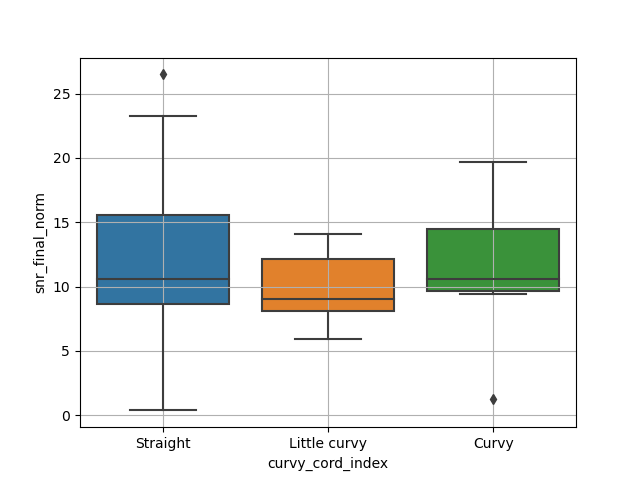

<IPython.core.display.Javascript object>

[Text(0, 0, 'Straight'), Text(1, 0, 'Little curvy'), Text(2, 0, 'Curvy')]

In [45]:
df = df_sc_all_slaser

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="snr_final_norm", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="lw_final", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])


## Curvyness vs. stuff

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


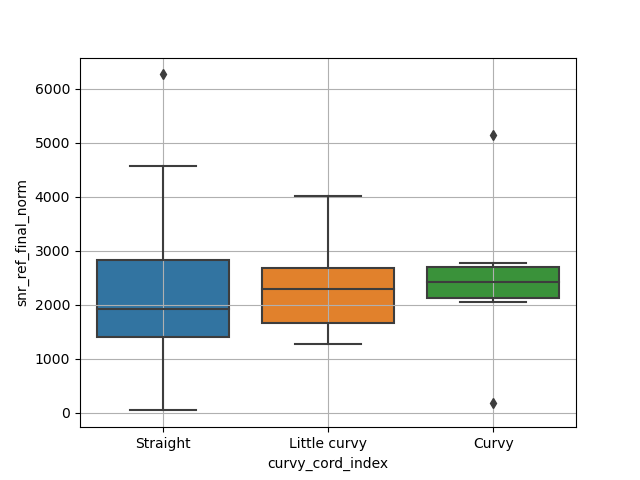

<IPython.core.display.Javascript object>


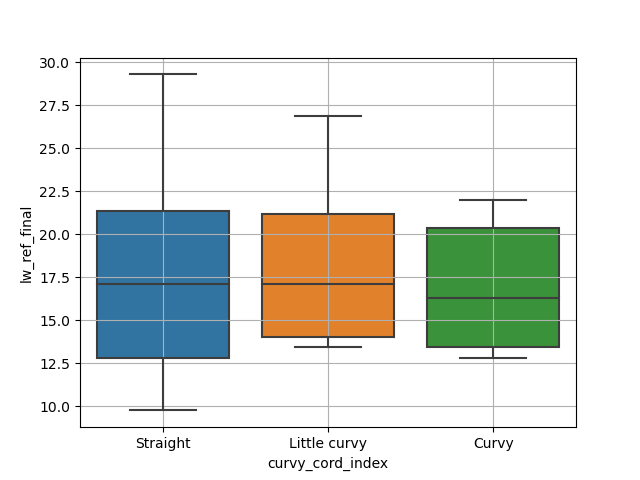

<IPython.core.display.Javascript object>


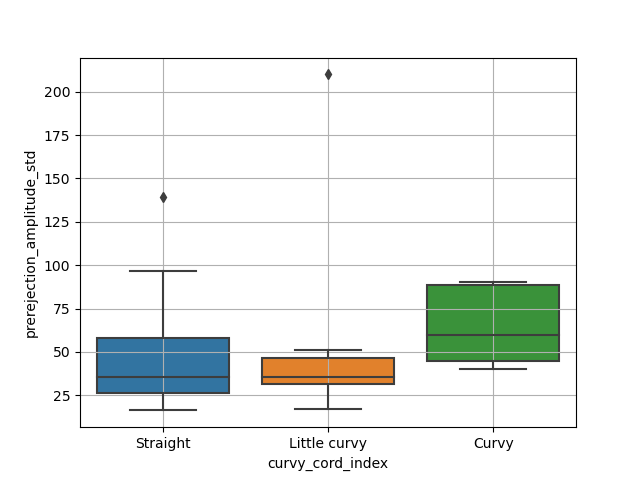

<IPython.core.display.Javascript object>


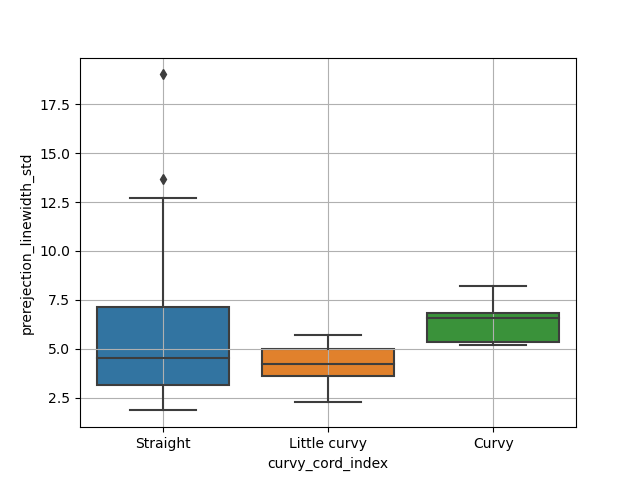

<IPython.core.display.Javascript object>


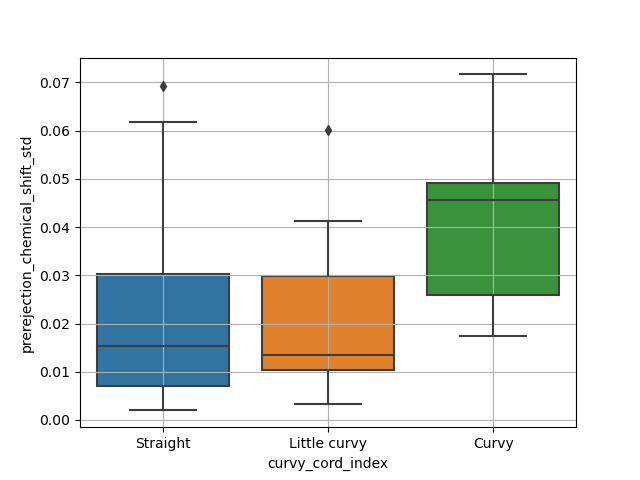

<IPython.core.display.Javascript object>


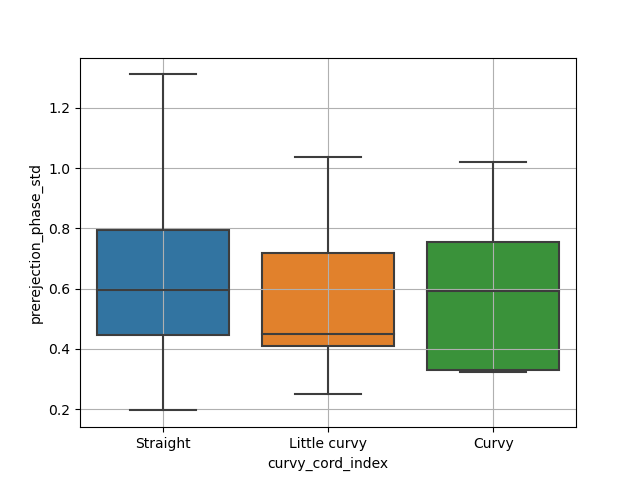

[Text(0, 0, 'Straight'), Text(1, 0, 'Little curvy'), Text(2, 0, 'Curvy')]

In [46]:
df = df_sc_all_slaser

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="voxel_angle_max_deg", data=df)
plt.grid('on')
plt.xlabel("cord curvyness")
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="patient_bmi", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="patient_sex", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="voxel_pos_y_mm", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="reco_dataset_raw_data_sequence_vref", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="snr_ref_final_norm", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="lw_ref_final", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="prerejection_amplitude_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="prerejection_linewidth_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="prerejection_chemical_shift_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="prerejection_phase_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

A few interesting but not very significant trends:
* Low-BMI people have a curvy cord compared to high-BMI: position on the coil probably...
* Curvy cords tend to slightly increase ref. SNR, i.e, water peak in voxel... PVE?
* Curvy cords have a tendency to give higher variations in amplitude, linewidth, chemical shift in the acquired MRS signal

## Curvyness vs. shims

<IPython.core.display.Javascript object>


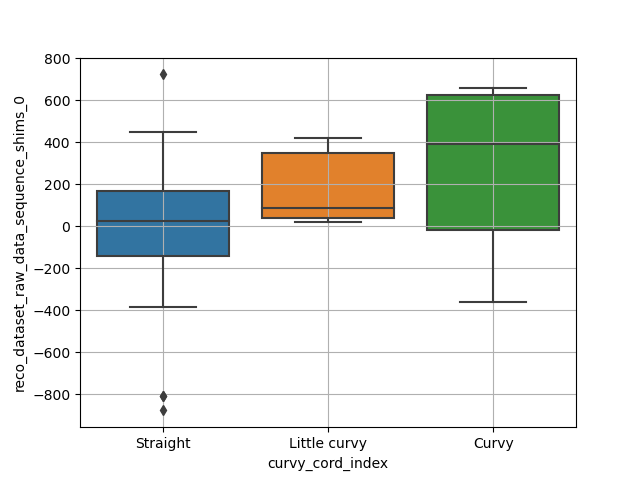

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


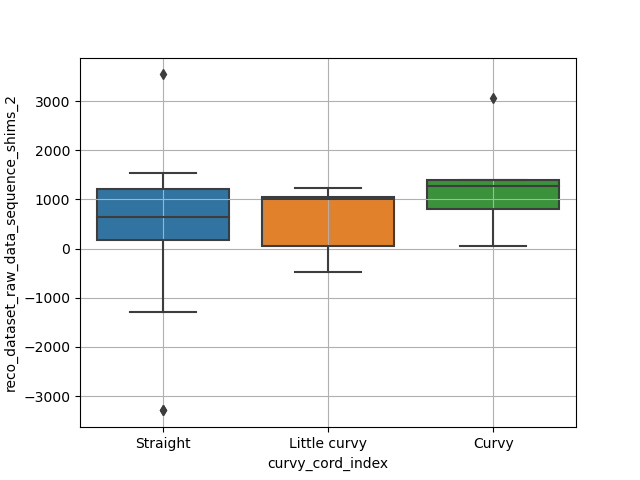

<IPython.core.display.Javascript object>


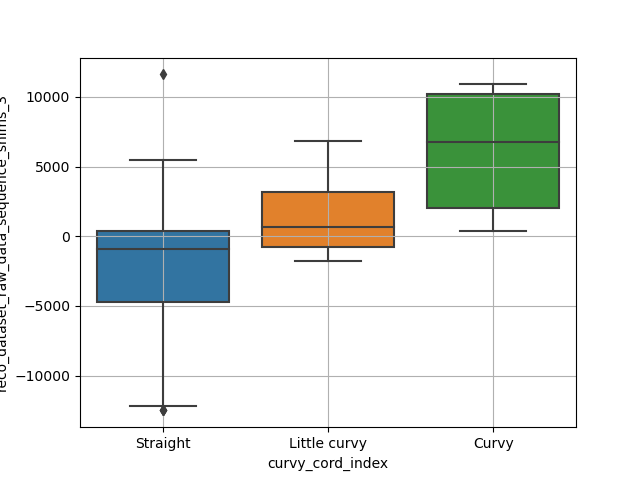

<IPython.core.display.Javascript object>


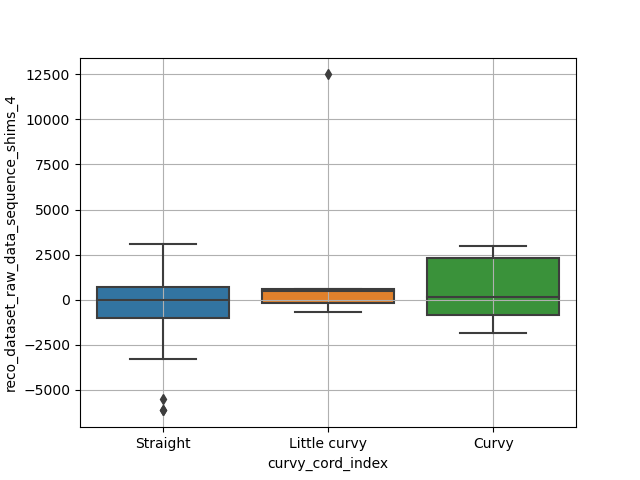

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


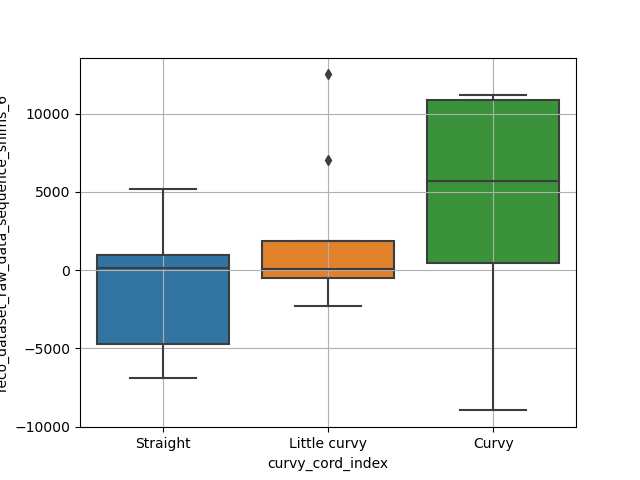

<IPython.core.display.Javascript object>


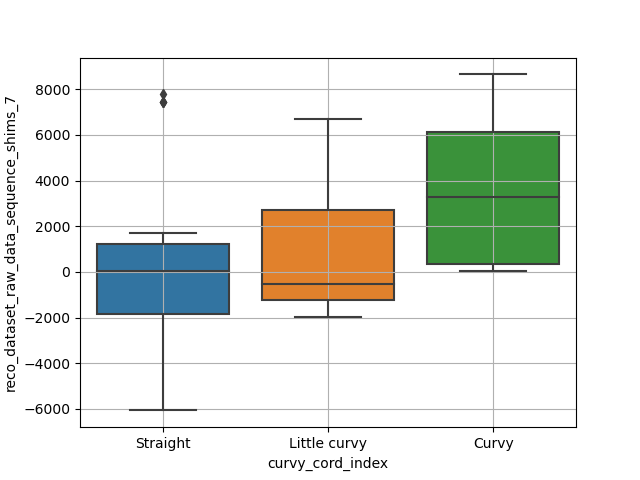

<IPython.core.display.Javascript object>


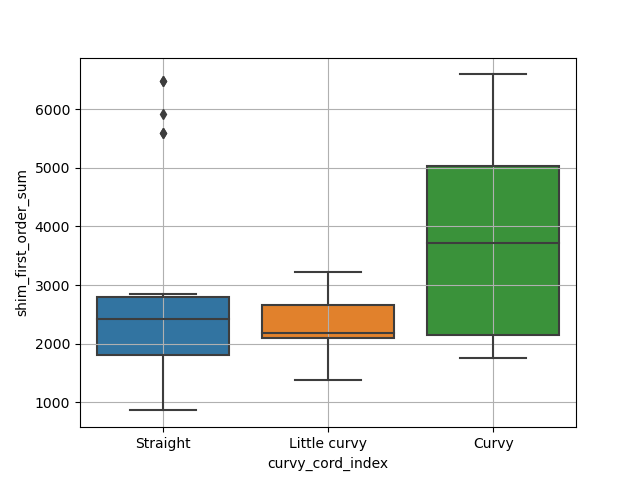

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[Text(0, 0, 'Straight'), Text(1, 0, 'Little curvy'), Text(2, 0, 'Curvy')]

In [47]:
# maybe related to shimming?
first_order_shim_ranges = [-4000, 4000]
second_order_shim_ranges = [-13000, 13000]
shim_labels = ['X', 'Y', 'Z', 'Z2', 'ZX', 'ZY', 'Z2-Y2', 'XY']
shim_ranges = [first_order_shim_ranges, first_order_shim_ranges, first_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges]

for this_shim_index, this_shim_name, this_shim_range in zip(range(8), shim_labels, shim_ranges):
    df_key = "reco_dataset_raw_data_sequence_shims_" + str(this_shim_index)
    
    plt.figure()
    g = sns.boxplot(x="curvy_cord_index", y=df_key, data=df)
    plt.grid('on')
    g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

# high shim voltage in general?
plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="shim_first_order_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])   
        
plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="shim_second_order_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"]) 
          
plt.figure()
g = sns.boxplot(x="curvy_cord_index", y="shim_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"]) 

Clearly, curvy cords need strong shim currents in order to be shimmed...

# All spectra

<IPython.core.display.Javascript object>


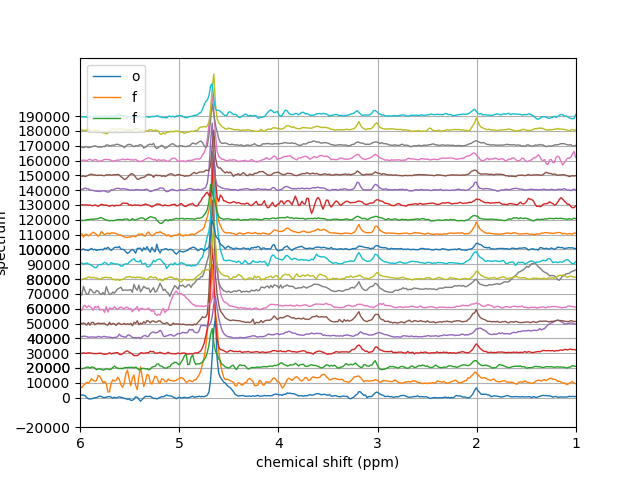

In [48]:
df = df_sc

k = 0
for this_index, this_row in df.iterrows():
    s = this_row["data_obj"]    
    s.set_display_offset(10000.0 * k)
    s.display_spectrum_1d(1000)
    k += 1

plt.legend('off')

# Minor questions and tests

## noWS vs. WS water linewidth

<IPython.core.display.Javascript object>


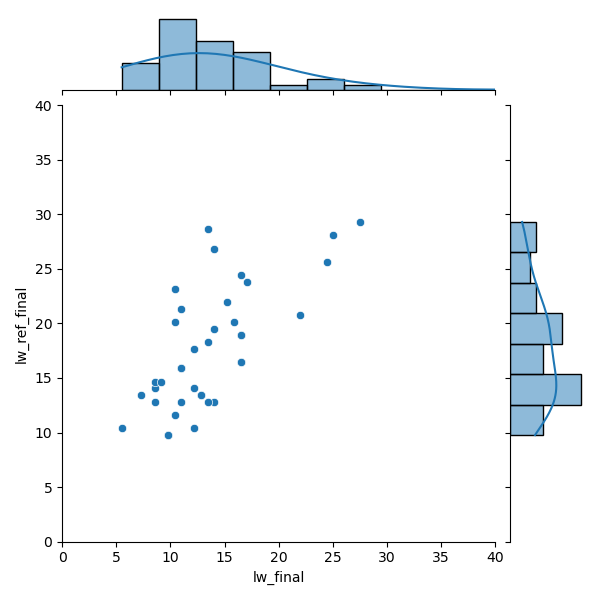

R = 0.35


In [49]:
df = df_sc_all_slaser

x = df["lw_final"]
y = df["lw_ref_final"]
g = sns.JointGrid(x=x, y=y, xlim=(0, 40), ylim=(0, 40))
g.plot_joint(sns.scatterplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Yes, the LW measured on WS-water is similar to the LW measured on nonWS-water. This observation validates the approach of constraining the metabolite damping factors during the fit to the LW observed on water.

## Intensity of noWS water peak
Is it connected to MRS quality? Maybe reflects CSF contamination?

<IPython.core.display.Javascript object>


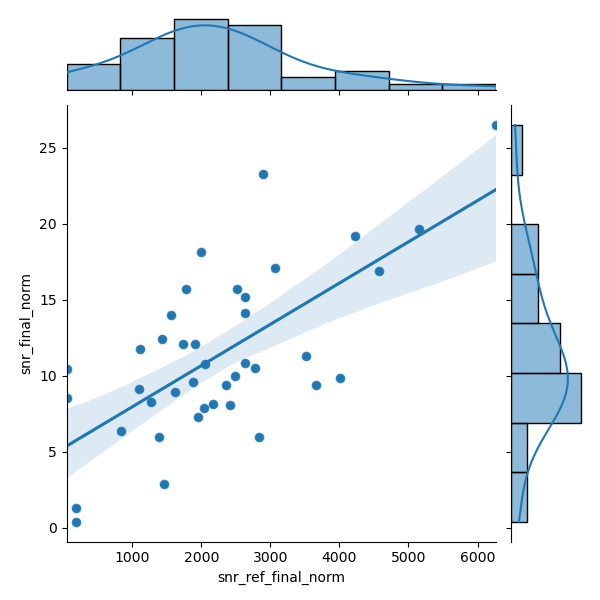

R = 0.67


In [50]:
df = df_sc_all_slaser

x = df["snr_ref_final_norm"]
y = df["snr_final_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Nope, wrong intuition. The water intensity in the ref. data is not negative correlated to the SNR or LW. More the opposite actually...

## Artefact around 5 ppm
This artefact seems to increase when voxel size decreases in the $x$ dimension. The sLASER sequence is a *semi-*LASER sequence, meaning that not all spatial dimensions are selected using adiabatic RF pulses (like in LASER). The $x$ dimension is selected using a standard asymmetric RF sinc pulse while $y$ and $z$ are selected using HSn RF pulses.

But not only...

### [FIG] for paper SI
with nice artefact spectrum

<IPython.core.display.Javascript object>


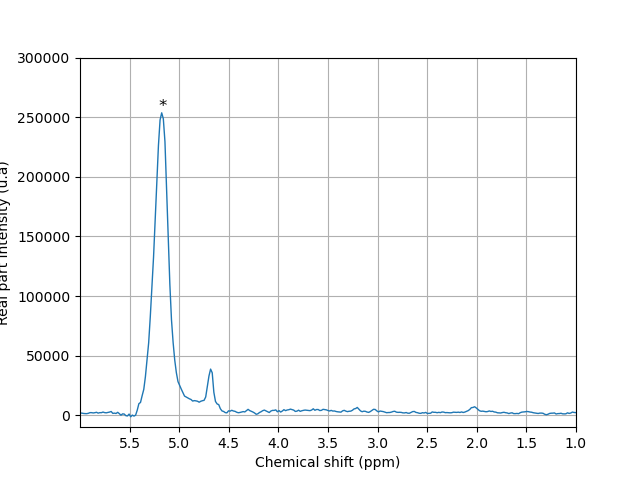

['S03 (P2)']

In [51]:
df = df_strong_artefact

# find big artefact datasets
biggest_artefact_df = df.loc[df["artefact_signal"] == df["artefact_signal"].max()]
s = biggest_artefact_df["data_obj"].iloc[0]
s._display_offset = 0
s.display_spectrum_1d(882)

ll = list(biggest_artefact_df["patient_pass_id_pretty"])

plt.ylabel("Real part intensity (u.a)")
plt.xlabel("Chemical shift (ppm)")
plt.xticks(np.arange(0, 6, 0.5))
plt.xlim([6, 1])
plt.ylim([-10000, 300000])
plt.legend().remove()
plt.text(5.21, 255000, "*", fontsize=12)

plt.savefig("./notebooks/figs/fig_artefact.svg")
ll

### Possible causes

<IPython.core.display.Javascript object>


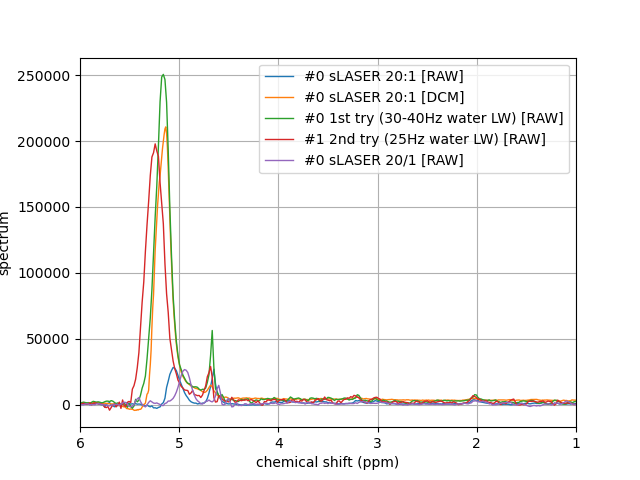

In [52]:
# look at all sLASER
df = df_sc_all_slaser

# find big artefact datasets
artefact_df = df.loc[df["artefact_signal_norm"] > 20000.0]
for s in artefact_df["data_obj"]:
    s.display_spectrum_1d(1200)

<IPython.core.display.Javascript object>


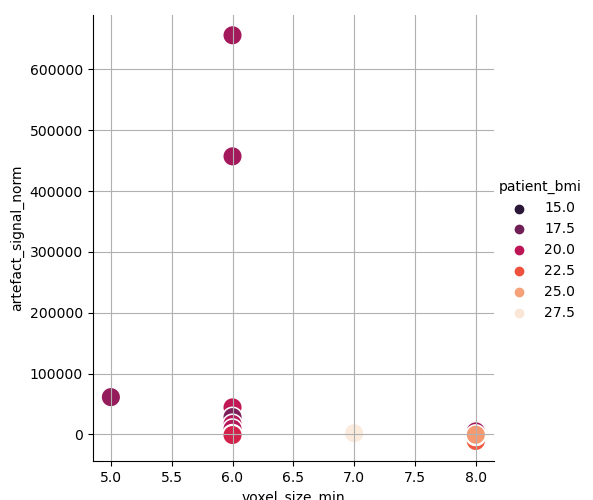

<IPython.core.display.Javascript object>


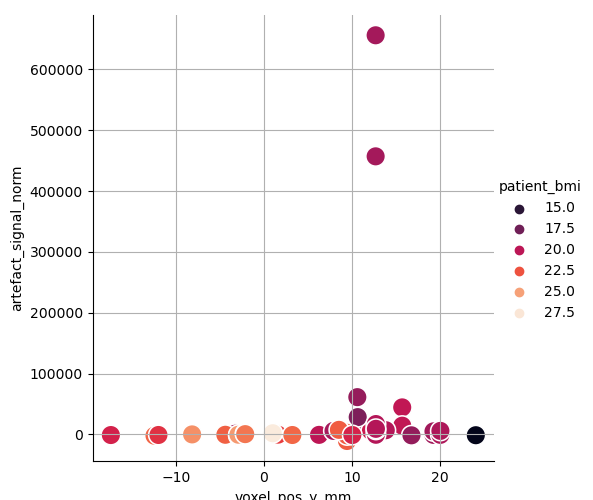

<IPython.core.display.Javascript object>


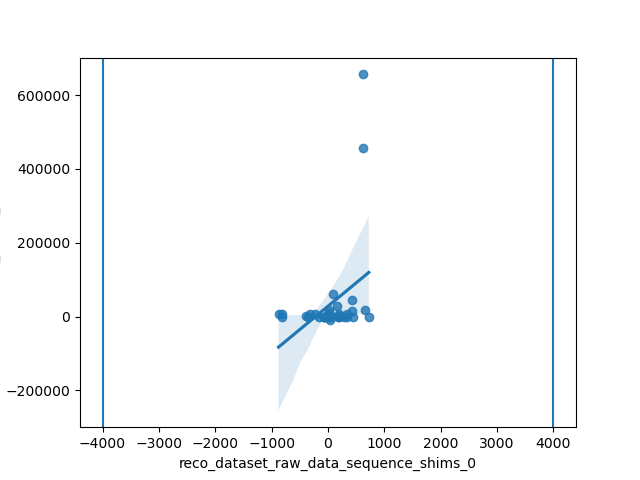

R = 0.37 for shim [X]


<IPython.core.display.Javascript object>


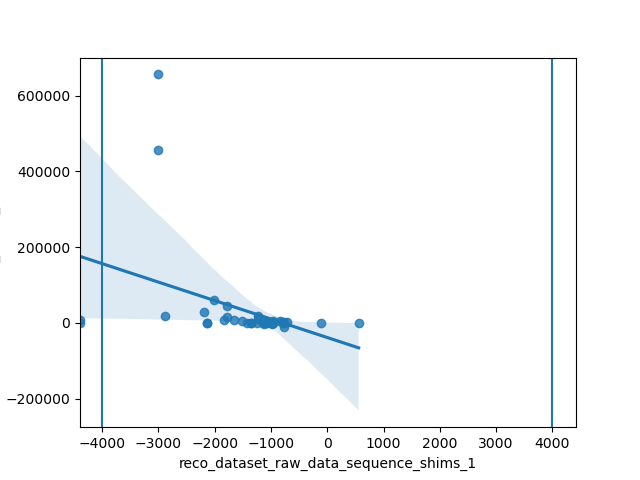

R = -0.38 for shim [Y]


<IPython.core.display.Javascript object>


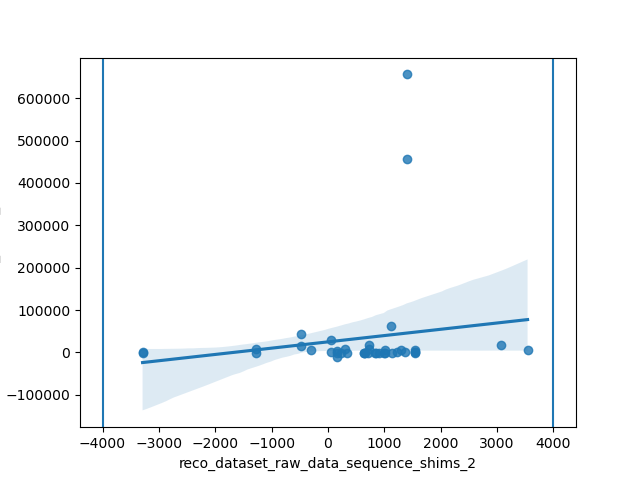

R = 0.15 for shim [Z]


<IPython.core.display.Javascript object>


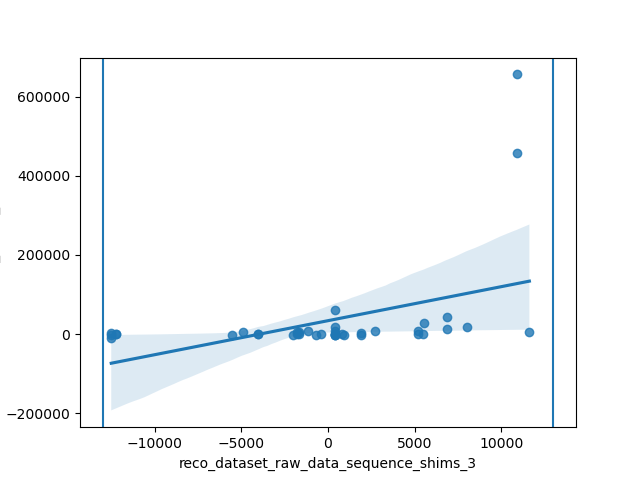

R = 0.43 for shim [Z2]


<IPython.core.display.Javascript object>


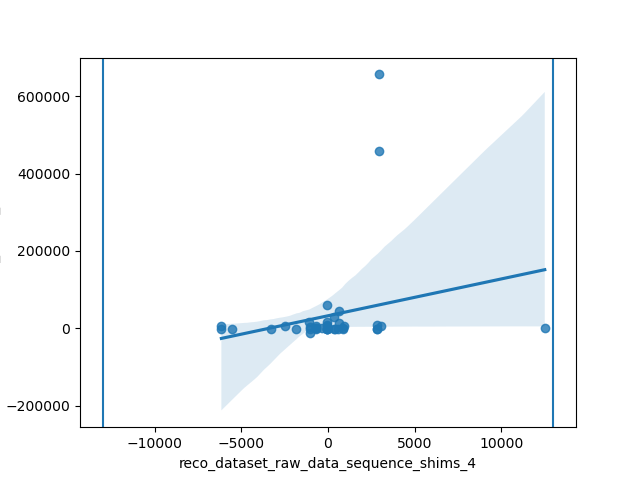

R = 0.23 for shim [ZX]


<IPython.core.display.Javascript object>


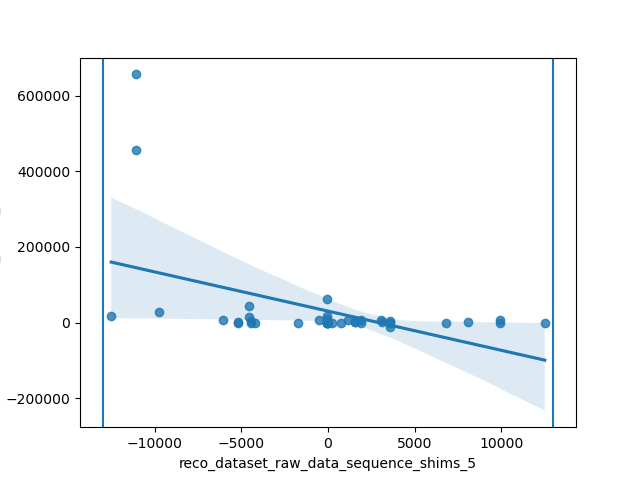

R = -0.47 for shim [ZY]


<IPython.core.display.Javascript object>

R = 0.50 for shim [Z2-Y2]


<IPython.core.display.Javascript object>


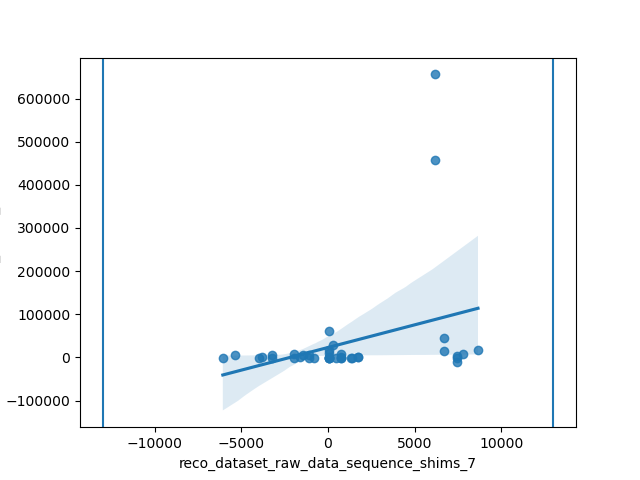

R = 0.32 for shim [XY]


<IPython.core.display.Javascript object>


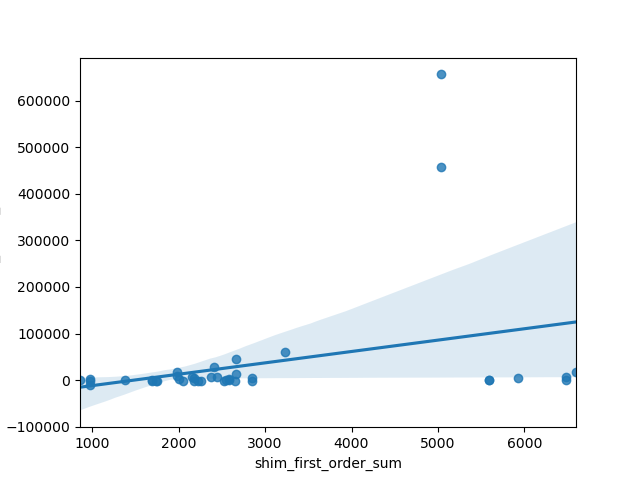

R = 0.32


<IPython.core.display.Javascript object>


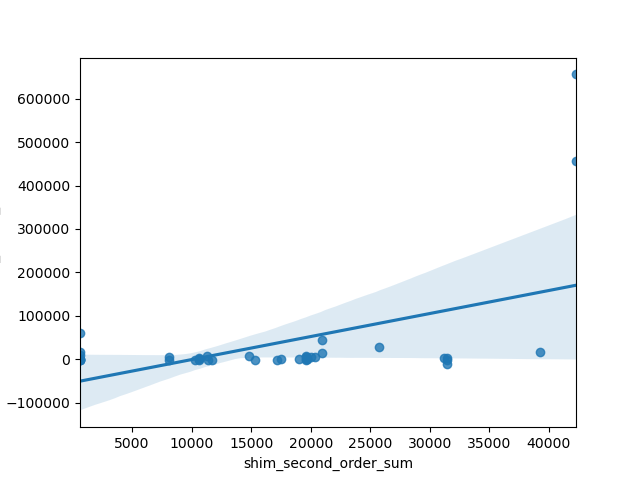

R = 0.50


<IPython.core.display.Javascript object>


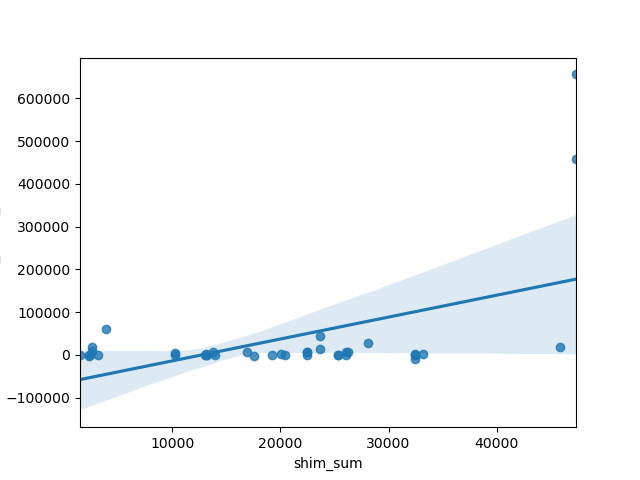

R = 0.51


In [53]:
# look at all sLASER
df = df_sc_all_slaser

x = df["voxel_size_min"]
y = df["artefact_signal_norm"]
z = df["patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=200)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["voxel_pos_y_mm"]
y = df["artefact_signal_norm"]
z = df["patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=200)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

# maybe related to shimming?
first_order_shim_ranges = [-4000, 4000]
second_order_shim_ranges = [-13000, 13000]
shim_labels = ['X', 'Y', 'Z', 'Z2', 'ZX', 'ZY', 'Z2-Y2', 'XY']
shim_ranges = [first_order_shim_ranges, first_order_shim_ranges, first_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges]

for this_shim_index, this_shim_name, this_shim_range in zip(range(8), shim_labels, shim_ranges):
    df_key = "reco_dataset_raw_data_sequence_shims_" + str(this_shim_index)
    x = df[df_key]
    y = df["artefact_signal_norm"]
    plt.figure()
    g = sns.regplot(x=x, y=y)
    plt.axvline(this_shim_range[0])
    plt.axvline(this_shim_range[1])
    print("R = %.2f for shim [%s]" % (x.corr(y), this_shim_name))

# high shim voltage in general?
x = df["shim_first_order_sum"]
y = df["artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
print("R = %.2f" % x.corr(y))         
          
x = df["shim_second_order_sum"]
y = df["artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
print("R = %.2f" % x.corr(y))
          
x = df["shim_sum"]
y = df["artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
print("R = %.2f" % x.corr(y)) 


I believe this artefact originates from badly localized signal in the $x$ dimension because of the poor efficiency of the half sinc selection pulse in inhomogenous $B_1$ situation (surface coil):
* This effect is increased when this bad pulse needs to select a small slice.
* Less clear but likely to happen, this effect is also increased when the VOI is far from the coil ($y$ position is high) and the $B_1$ inhomogeneity gets even more crazy.
* This problem could be connected to $B_0$ field homogeneity too! The worst cases were observed for maximum shim voltages... especially for 2nd order shim. Basically meaning that the shim adjustment failed and the operator (me) did not check, resulting in potential huge and shim-generated $B_0$ field inhomogeneity...

Related to $B_0$ and $B_1$ fields heterogeneity in general!

## SNR vs. NA
Curious to see if the usual SNR and $/sqrt(NA)$ dependence is observable

<IPython.core.display.Javascript object>


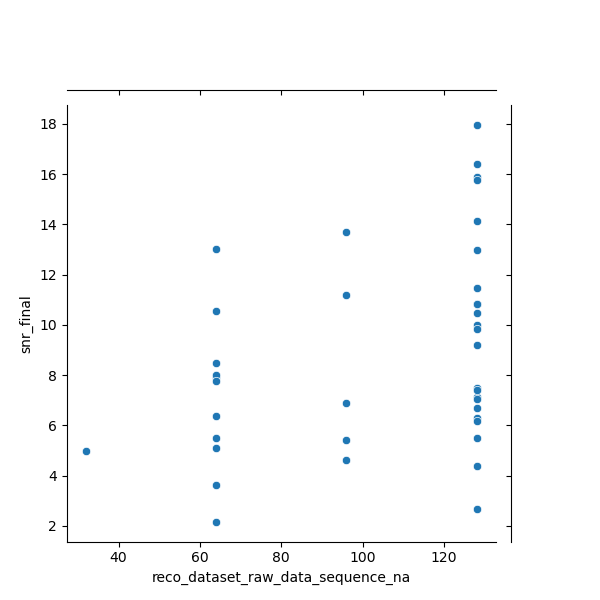

In [54]:
df = df_sc_all_slaser

x = df["reco_dataset_raw_data_sequence_na"]
y = df["snr_final"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)


## sLASER protocols: gain in SNR, LW & TE
Compare protocols 20/1, 10/2, 5/5 when possible in terms of SNR/LW

In [55]:
df = df_sc_all_slaser

# get the scans hash manually
df_slaser_tests = df.loc[(df["patient_pass_id"] == "314_P1")
                        | (df["patient_pass_id"] == "316_P1")
                        | (df["patient_pass_id"] == "319_P1")
                        | (df["patient_pass_id"] == "329_P1")
                        | (df["patient_pass_id"] == "336_P2")]

df_slaser_tests = df_slaser_tests.drop("967a1b8dace220e916df680759f31d84")

df_slaser_tests.at[df_slaser_tests["reco_dataset_raw_data_sequence_pulse_rfc_r"] >= 20, "sequence_R"] = 20
df_slaser_tests.at[df_slaser_tests["reco_dataset_raw_data_sequence_pulse_rfc_r"] == 10, "sequence_R"] = 10
df_slaser_tests.at[df_slaser_tests["reco_dataset_raw_data_sequence_pulse_rfc_r"] == 5, "sequence_R"] = 5

df_slaser_tests[["patient_pass_id", "reco_dataset_legend", "sequence_R", "reco_dataset_raw_data_sequence_pulse_rfc_n"]]

/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,,patient_pass_id,reco_dataset_legend,sequence_R,reco_dataset_raw_data_sequence_pulse_rfc_n
index,reco_template_name,,,,
0a58f85af8c32d06cbbca74391447ad2,sc,314_P1,#0 sLASER 20:1,20.0,1.0
2195967ae34d5ef7dcfba4fc93a9e121,sc,314_P1,#1 sLASER 5:5,5.0,5.0
fe34c6902afd341a0c81de0a0b6d6373,sc,316_P1,#0 sLASER 20:1,20.0,1.0
5f9a42662bfe3586bee57f3ead964778,sc,316_P1,#1 sLASER 5:5,5.0,5.0
3c700829d5feb605285c5ef7cfad4055,sc,319_P1,#0 sLASER 20:1,20.0,1.0
f416f6db6cda52195e3b8046fc586ef2,sc,319_P1,#1 sLASER 10:2,10.0,2.0
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,sc,329_P1,#0 sLASER 20:1,20.0,1.0
2a9fe3c48c69e575db0a8eeeb202d44d,sc,329_P1,#1 sLASER 10:2,10.0,2.0
49872ea4c73b9206c804c4fdaa298ed9,sc,336_P2,#1 sLASER 20/1 NA=64 notrig,20.0,1.0


In [56]:
df_slaser_tests_R10 = df_slaser_tests.loc[(df_slaser_tests["sequence_R"] >= 20) | (df_slaser_tests["sequence_R"] == 10)]
df_slaser_tests_R10 = df_slaser_tests_R10.drop("fe34c6902afd341a0c81de0a0b6d6373")
df_slaser_tests_R10 = df_slaser_tests_R10.drop("0a58f85af8c32d06cbbca74391447ad2")
df_slaser_tests_R10 = df_slaser_tests_R10.sort_values(by=["patient_pass_id", "sequence_R"], ascending=False)
df_slaser_tests_R10["snr_rel_diff"] = df_slaser_tests_R10.groupby(["patient_pass_id"])["snr_final"].pct_change().fillna(0) * 100.0
df_slaser_tests_R10["lw_diff"] = df_slaser_tests_R10.groupby(["patient_pass_id"])["lw_final"].diff().fillna(0)
df_slaser_tests_R10["te_diff"] = df_slaser_tests_R10.groupby(["patient_pass_id"])["reco_dataset_raw_data_sequence_te"].diff().fillna(0)

df_slaser_tests_R10[["patient_pass_id", "reco_dataset_legend", "sequence_R", "snr_final", "snr_rel_diff", "lw_final", "lw_diff", "te_diff"]]

/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,,patient_pass_id,reco_dataset_legend,sequence_R,snr_final,snr_rel_diff,lw_final,lw_diff,te_diff
index,reco_template_name,,,,,,,,
49872ea4c73b9206c804c4fdaa298ed9,sc,336_P2,#1 sLASER 20/1 NA=64 notrig,20.0,6.373571,0.000000,9.155273,0.000000e+00,0.00
355445d1bac5ee682c88f889b4c01d09,sc,336_P2,#3 sLASER 10/2 NA=64 notrig,10.0,7.780715,22.077811,5.493164,-3.662109e+00,-20.08
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,sc,329_P1,#0 sLASER 20:1,20.0,15.886397,0.000000,16.479492,0.000000e+00,0.00
2a9fe3c48c69e575db0a8eeeb202d44d,sc,329_P1,#1 sLASER 10:2,10.0,13.038838,-17.924512,16.479492,3.517187e-13,-16.00
3c700829d5feb605285c5ef7cfad4055,sc,319_P1,#0 sLASER 20:1,20.0,8.017169,0.000000,9.765625,0.000000e+00,0.00
f416f6db6cda52195e3b8046fc586ef2,sc,319_P1,#1 sLASER 10:2,10.0,13.698833,70.868704,9.765625,-2.309264e-13,-24.00


In [57]:
df_slaser_tests_R5 = df_slaser_tests.loc[(df_slaser_tests["sequence_R"] >= 20) | (df_slaser_tests["sequence_R"] == 5)]
df_slaser_tests_R5 = df_slaser_tests_R5.drop("fc8cb0e8f7b3747a10eeabc1cf8ab9fb")
df_slaser_tests_R5 = df_slaser_tests_R5.drop("3c700829d5feb605285c5ef7cfad4055")
df_slaser_tests_R5 = df_slaser_tests_R5.sort_values(by=["patient_pass_id", "sequence_R"], ascending=False)
df_slaser_tests_R5["snr_rel_diff"] = df_slaser_tests_R5.groupby(["patient_pass_id"])["snr_final"].pct_change().fillna(0) * 100.0
df_slaser_tests_R5["lw_diff"] = df_slaser_tests_R5.groupby(["patient_pass_id"])["lw_final"].diff().fillna(0)
df_slaser_tests_R5["te_diff"] = df_slaser_tests_R5.groupby(["patient_pass_id"])["reco_dataset_raw_data_sequence_te"].diff().fillna(0)

df_slaser_tests = pd.concat([df_slaser_tests_R10, df_slaser_tests_R5])

df_slaser_tests[["patient_pass_id", "reco_dataset_legend", "sequence_R", "snr_final", "snr_rel_diff", "lw_final", "lw_diff", "te_diff"]]

/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,,patient_pass_id,reco_dataset_legend,sequence_R,snr_final,snr_rel_diff,lw_final,lw_diff,te_diff
index,reco_template_name,,,,,,,,
49872ea4c73b9206c804c4fdaa298ed9,sc,336_P2,#1 sLASER 20/1 NA=64 notrig,20.0,6.373571,0.000000,9.155273,0.000000e+00,0.00
355445d1bac5ee682c88f889b4c01d09,sc,336_P2,#3 sLASER 10/2 NA=64 notrig,10.0,7.780715,22.077811,5.493164,-3.662109e+00,-20.08
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,sc,329_P1,#0 sLASER 20:1,20.0,15.886397,0.000000,16.479492,0.000000e+00,0.00
2a9fe3c48c69e575db0a8eeeb202d44d,sc,329_P1,#1 sLASER 10:2,10.0,13.038838,-17.924512,16.479492,3.517187e-13,-16.00
3c700829d5feb605285c5ef7cfad4055,sc,319_P1,#0 sLASER 20:1,20.0,8.017169,0.000000,9.765625,0.000000e+00,0.00
f416f6db6cda52195e3b8046fc586ef2,sc,319_P1,#1 sLASER 10:2,10.0,13.698833,70.868704,9.765625,-2.309264e-13,-24.00
49872ea4c73b9206c804c4fdaa298ed9,sc,336_P2,#1 sLASER 20/1 NA=64 notrig,20.0,6.373571,0.000000,9.155273,0.000000e+00,0.00
fd2940e9489a5d28773792aeb95f54e7,sc,336_P2,#2 sLASER 5/5 NA=64 notrig,5.0,5.510886,-13.535346,13.427734,4.272461e+00,-29.68
fe34c6902afd341a0c81de0a0b6d6373,sc,316_P1,#0 sLASER 20:1,20.0,5.491950,0.000000,14.038086,0.000000e+00,0.00


<IPython.core.display.Javascript object>


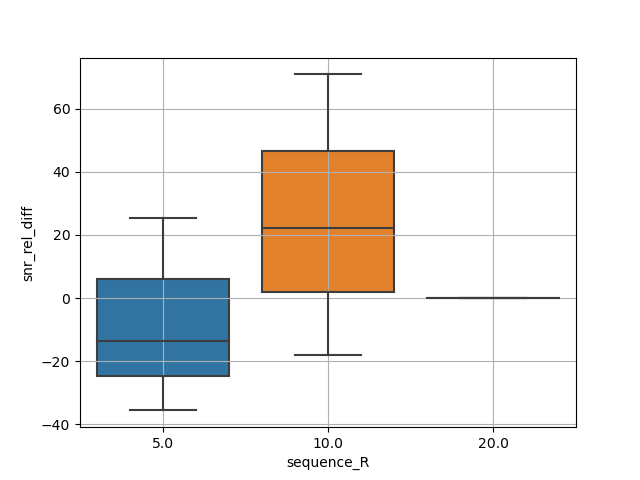

<IPython.core.display.Javascript object>


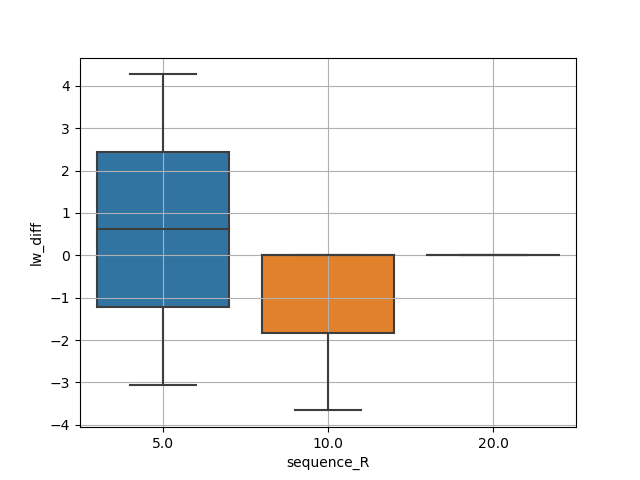

<IPython.core.display.Javascript object>


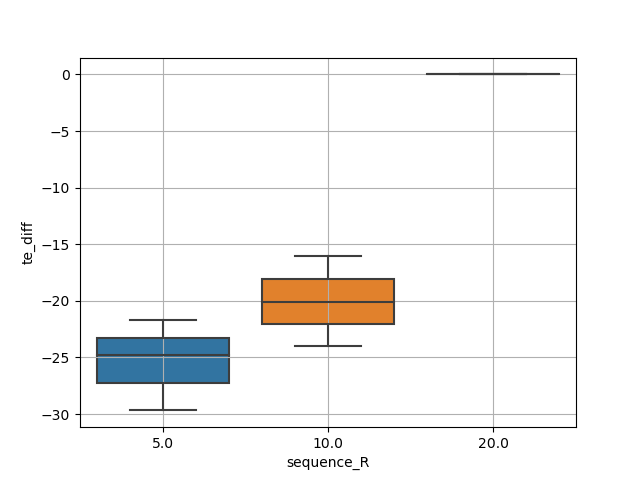

In [58]:
plt.figure()
g = sns.boxplot(x="sequence_R", y="snr_rel_diff", data=df_slaser_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="sequence_R", y="lw_diff", data=df_slaser_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="sequence_R", y="te_diff", data=df_slaser_tests)
plt.grid('on')

Interesting... I see that the R=20/1 is maybe not the best protocol to use... 
* The SNR is increased when switching to R=10/2, the LW looks unchanged
* The SNR is not really increased when switching to R=5 (starting to suffer from bad selectivity ?)
* The TE is reduced in both cases quite a lot >20ms

Seems I should have used 10/2 as the standard protocol. In theory less adiabatic but gives a shorter TE and higher SNR (probably connected but not sure when looking at the 5/5 results).

However, I need to find or remember why I used the 20/1 most of the time to justify in the paper. First let's see the proportion of this and that protocol in the P1/P2 data. In theory, the 10/2 scans should remain because the highest SNR scan per study was kept.

In [59]:
df = df_sc

df_20 = df.loc[df["reco_dataset_raw_data_sequence_pulse_rfc_r"] >= 20]
df_10 = df.loc[df["reco_dataset_raw_data_sequence_pulse_rfc_r"] == 10]
df_5 = df.loc[df["reco_dataset_raw_data_sequence_pulse_rfc_r"] == 5]

print("* P1 and P2 scans represent %d datasets" % len(df))
print("* sLASER R>=20 was used %d times (%.2f%%)" % (len(df_20), len(df_20)/len(df) * 100))
print("* sLASER R==10 was used %d times (%.2f%%)" % (len(df_10), len(df_10)/len(df) * 100))
print("* sLASER R==5 was used %d times (%.2f%%)" % (len(df_5), len(df_5)/len(df) * 100))

df

* P1 and P2 scans represent 20 datasets
* sLASER R>=20 was used 14 times (70.00%)
* sLASER R==10 was used 5 times (25.00%)
* sLASER R==5 was used 1 times (5.00%)


,,reco_dataset_legend,reco_dataset_physio_file,reco_dataset_imaging_file,reco_dataset_resp_bpm,reco_dataset_heart_bpm,reco_dataset_comment,reco_dataset_raw_files,data_obj,reco_dataset_raw_analysis_results_phasing_snr,reco_dataset_raw_analysis_results_phasing_lw,...,reco_dataset_raw_data_sequence_shims_3,reco_dataset_raw_data_sequence_shims_4,reco_dataset_raw_data_sequence_shims_5,reco_dataset_raw_data_sequence_shims_6,reco_dataset_raw_data_sequence_shims_7,patient_id_pretty,patient_pass_id_pretty_suffix,patient_pass_id_pretty,voxel_angle_max_deg,curvy_cord_index
index,reco_template_name,,,,,,,,,,,,,,,,,,,,,
2fff316122fc89a0b4d1f918f6cd62d8,sc,#1 sLASER R:N=25:1 trig,None,None,None,None,No REF scan !,[/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/...,"[(462.82838959982934+61.37810233592992j), (443...",4.809585,19.531250,...,-12219.0,854.0,-5218.0,-654.0,757.0,S02,(P1),S02 (P1),0.110008,1.0
1baf6b702f39fefb5ad9e44179057ef7,sc,#3 sLASER 10:2 repos. + resp trig,None,None,20,55,None,[/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/...,"[(792.9756775268969-68.2420221951057j), (778.4...",4.772872,27.465820,...,-1164.0,3059.0,-497.0,2308.0,7779.0,S04,(P1),S04 (P1),0.198216,1.0
a2b582b37a04bd4efc43138368bc0b96,sc,#0 sLASER 20:1 resp trig,None,None,15,65,None,[/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/...,"[(422.1981441670996+14.159555295872144j), (408...",4.111332,34.790039,...,8042.0,-1106.0,-12500.0,-8970.0,8649.0,S05,(P1),S05 (P1),0.069668,3.0
7cb024e470b0b2b072436635a19a1c00,sc,#0 sLASER 20:1,None,None,16,55,None,[/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/...,"[(451.40481564843327+59.996600878281484j), (43...",5.979506,17.700195,...,-403.0,571.0,-4202.0,12500.0,1374.0,S07,(P1),S07 (P1),0.169272,2.0
9f8067ea065153da5b3a352d58f6ca23,sc,#0 sLASER 20:1,None,None,12,None,None,[/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/...,"[(1172.9662053308161-376.56531548777417j), (11...",4.645519,23.803711,...,-4921.0,-2487.0,-6061.0,1211.0,-5376.0,S08,(P1),S08 (P1),0.452177,1.0
0a58f85af8c32d06cbbca74391447ad2,sc,#0 sLASER 20:1,None,None,17,75,None,[/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/...,"[(743.6148599367879+4.306274170843586j), (697....",9.302507,14.648437,...,-1795.0,-708.0,-4414.0,75.0,-1114.0,S09,(P1),S09 (P1),4.702408,2.0
5f9a42662bfe3586bee57f3ead964778,sc,#1 sLASER 5:5,None,None,11,65,None,[/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/...,"[(530.9393960587557+67.09721618181862j), (515....",2.183133,15.869141,...,6845.0,610.0,-4535.0,-2275.0,6716.0,S10,(P1),S10 (P1),4.379971,2.0
f416f6db6cda52195e3b8046fc586ef2,sc,#1 sLASER 10:2,None,None,NaN,NaN,None,[/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/...,"[(1752.7236987556798-778.2114599331583j), (189...",7.885078,10.375977,...,381.0,-31.0,-33.0,117.0,61.0,S11,(P1),S11 (P1),6.289956,1.0
b9875913db5c0f321922f819401cc02e,sc,#0 sLASER 20:1,None,None,18,60,None,[/home/tangir/crmbm/acq_twix/328-af-p1-moelle/...,"[(376.1950439146745-27.446351572677447j), (378...",6.313808,14.648438,...,1881.0,2797.0,752.0,-4553.0,1349.0,S12,(P1),S12 (P1),0.089529,1.0


Ok, and when did I prefer using this or that protocol. Did it depend on Vref, BMI ? 

<IPython.core.display.Javascript object>


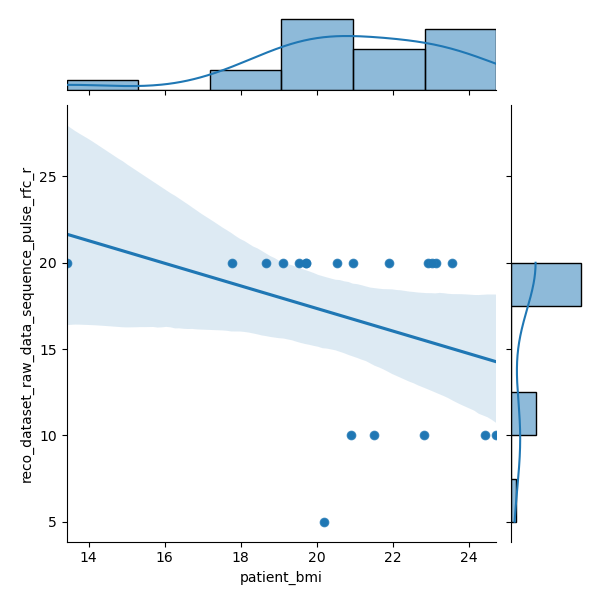

R = -0.33


<IPython.core.display.Javascript object>


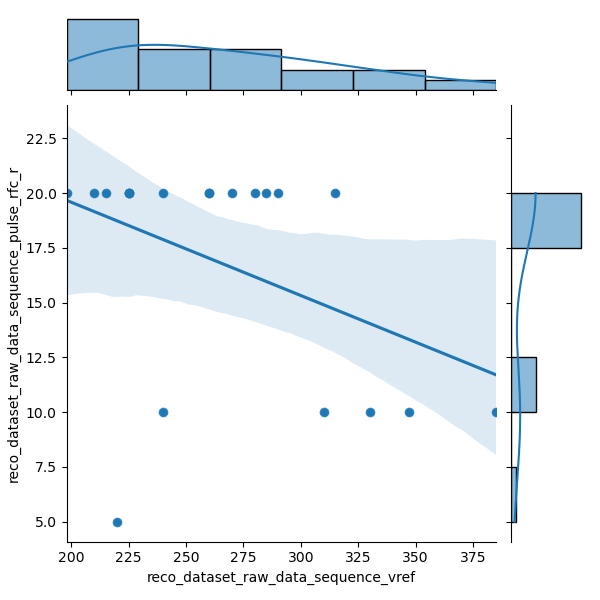

R = -0.42


In [60]:
x = df["patient_bmi"]
y = df["reco_dataset_raw_data_sequence_pulse_rfc_r"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["reco_dataset_raw_data_sequence_vref"]
y = df["reco_dataset_raw_data_sequence_pulse_rfc_r"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Ok makes sense. Since I was preferably scanning at R=20, I reduced R when BMI/Vref was too high (~300V). So it's not really like I had a choice.

But still I should performed R=10 systematically, it gives lower TE and stronger SNR. This was probably not the case in vitro because of long T2s...

It would be nice to estimate spectral quality with more than just SNR and LW. I suspect artefacts, lipids and shit showing up when reducing R because of bad selectivity and voxel contamination.

## 1st vs. 2nd order shimming
- Did 2nd order shim help? Extracting data from notebooks.

In [61]:
df = df_sc

# found this in my labbooks:
patient_list = [313,     319,     328, 329, 333, 336,  338,  300,    311,  336,  319,  313,  314,  349  ]
pass_list = [    1,       1,       1,   1,   1,   1,    1,    2,      2,    1,    2,    2,    2,    2  ]
lw_linear = [    45,      25,      25,  30,  45,  30,   25,   35, np.nan,  np.nan,   39,   30,   20,   26  ]
lw_full = [      55,  np.nan,      40,  25,  50,  60,   35, 37.5,     25,   27,  np.nan,   50,   25,   30  ]

# keep only patient and study present in df
patient_list2 = []
pass_list2 = []
lw_linear2 = []
lw_full2 = []
for this_patient_id, this_pass, lw1, lw2 in zip(patient_list, pass_list, lw_linear, lw_full):
    if(str(this_patient_id) in df["patient_id"].to_list() and this_pass in df.loc[df["patient_id"] == str(this_patient_id)]["pass"].to_list()):
        patient_list2.append(this_patient_id)
        pass_list2.append(this_pass)
        lw_linear2.append(lw1)
        lw_full2.append(lw2)

lw_linear2 = np.array(lw_linear2)
lw_full2 = np.array(lw_full2)
lw_diff2 = lw_full2 - lw_linear2
lw_diff2 = lw_diff2[~np.isnan(lw_diff2)]
print("In average, there was a %.2f +/- %.2f Hz change for the water LW when going from 1st to 2nd order shimming!" % (lw_diff2.mean(),lw_diff2.std()))


In average, there was a 10.17 +/- 9.81 Hz change for the water LW when going from 1st to 2nd order shimming!


## Effective acquisition time & acquisition time
Any idea of how long shoud we scan?
Does it depend on SNR (I hope!) or BMI?

<IPython.core.display.Javascript object>


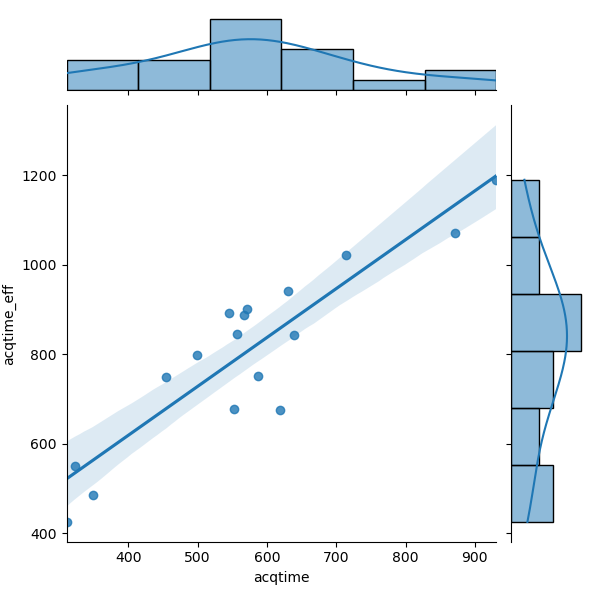

R = 0.90


<IPython.core.display.Javascript object>


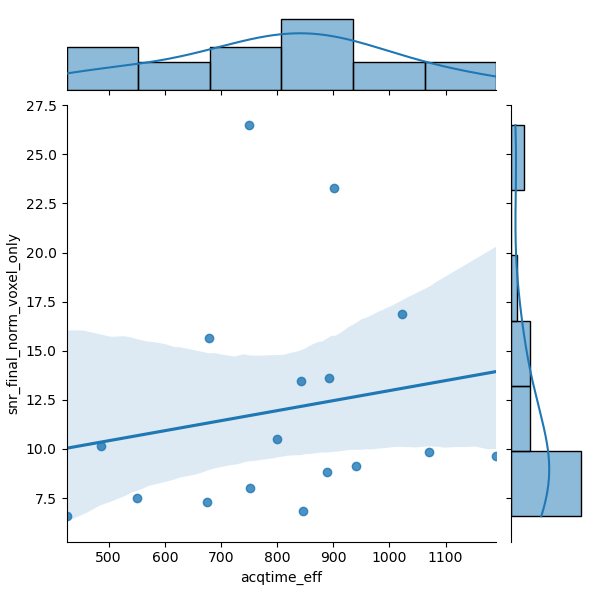

R = 0.18


In [62]:
df = df_sc

x = df["acqtime"]
y = df["acqtime_eff"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["acqtime_eff"]
y = df["snr_final_norm_voxel_only"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


This what we can see:
* fat subjects need longer scan time (actually constrained by SAR and long TR
* weak correlation between VOI-normalized SNR and acquisition time

## Data realignment/rejection: gain in SNR & LW
- Evaluate data rejection approaches

In [63]:
df = df_sc_all_reco.reset_index()

df = df.sort_values(by=["index", "reco_template_name"])

df["snr_rel_diff"] = df.groupby(["index"])["snr_final"].pct_change().fillna(0) * 100.0
df["lw_diff"] = df.groupby(["index"])["lw_final"].diff().fillna(0)

df[["reco_template_name", "snr_final", "snr_rel_diff", "lw_final", "lw_diff"]]

,reco_template_name,snr_final,snr_rel_diff,lw_final,lw_diff
5,sc,16.394888,0.000000,12.207031,0.000000e+00
25,sc_nodatarej,16.042351,-2.150281,12.207031,0.000000e+00
45,sc_nodatarej_norea,15.857776,-1.150549,15.258789,3.051758e+00
1,sc,7.917262,0.000000,24.414062,0.000000e+00
21,sc_nodatarej,8.838886,11.640691,24.414063,1.055156e-12
41,sc_nodatarej_norea,8.089189,-8.481807,28.076172,3.662109e+00
10,sc,5.094054,0.000000,12.207031,0.000000e+00
30,sc_nodatarej,5.327435,4.581444,12.207031,0.000000e+00
50,sc_nodatarej_norea,5.675257,6.528879,13.427734,1.220703e+00
0,sc,10.824073,0.000000,10.986328,0.000000e+00


<IPython.core.display.Javascript object>


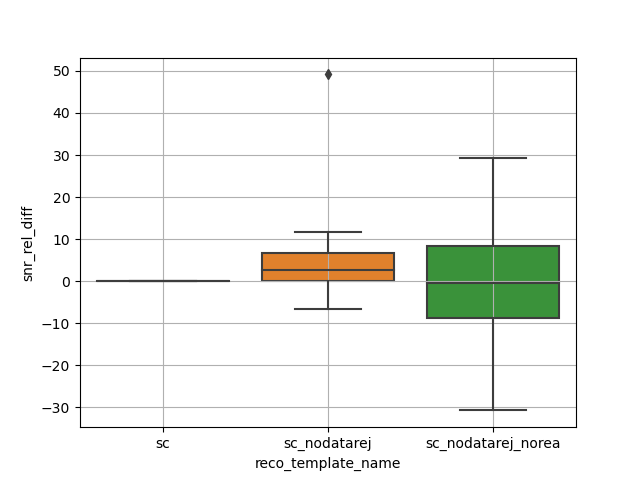

<IPython.core.display.Javascript object>


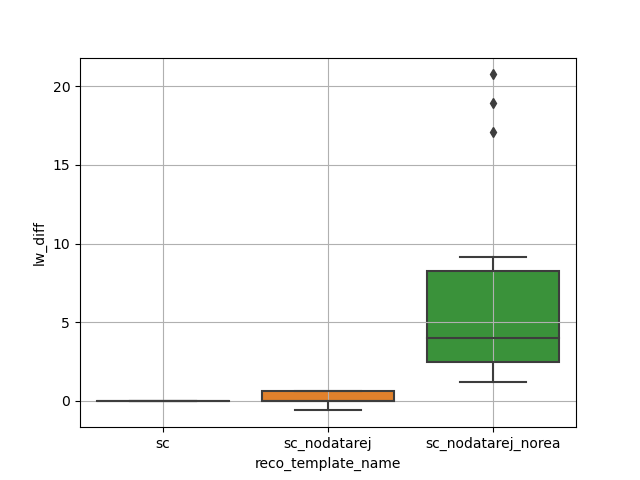

In [64]:
plt.figure()
g = sns.boxplot(x="reco_template_name", y="snr_rel_diff", data=df)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_template_name", y="lw_diff", data=df)
plt.grid('on')

## Gating approaches: gain in SNR & LW
For subjects who were scanned with different gating methods
* compare final SNR and LW
* compare peak properties variability (before data rejection)

In [65]:
df = df_sc_all_slaser

# get the scans hash manually
df_gating_tests = df.loc[(df["patient_pass_id"] == "300_P1")
                        | (df["patient_pass_id"] == "307_P1")
                        | (df["patient_pass_id"] == "311_P2")
                        | (df["patient_pass_id"] == "336_P2")]

df_gating_tests = df_gating_tests.loc[df_gating_tests["reco_dataset_raw_data_sequence_gating_mode"] != sim.gating_signal_source.CARDIAC_GATING]

# remove some scans
df_gating_tests = df_gating_tests.drop("1baf6b702f39fefb5ad9e44179057ef7")
df_gating_tests = df_gating_tests.drop("fd2940e9489a5d28773792aeb95f54e7")
df_gating_tests = df_gating_tests.drop("355445d1bac5ee682c88f889b4c01d09")
df_gating_tests[["patient_pass_id", "reco_dataset_raw_data_sequence_gating_mode"]]


/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,,patient_pass_id,reco_dataset_raw_data_sequence_gating_mode
index,reco_template_name,,
fb81785a61e346c7fdbb37479f312ca5,sc,300_P1,gating_signal_source.NO_GATING
2fff316122fc89a0b4d1f918f6cd62d8,sc,300_P1,gating_signal_source.RESP_GATING
159437f4b7de93d40c7fef7853019df3,sc,307_P1,gating_signal_source.RESP_GATING
4a3a0b1b9f85f1928b9bfb342358fef4,sc,307_P1,gating_signal_source.NO_GATING
75ae13bc44bf3d55f5be46d4c59df84d,sc,311_P2,gating_signal_source.RESP_GATING
caf8ec7f9e1026afbfa1e2c41ba43539,sc,311_P2,gating_signal_source.NO_GATING
967a1b8dace220e916df680759f31d84,sc,336_P2,gating_signal_source.RESP_GATING
49872ea4c73b9206c804c4fdaa298ed9,sc,336_P2,gating_signal_source.NO_GATING


<IPython.core.display.Javascript object>


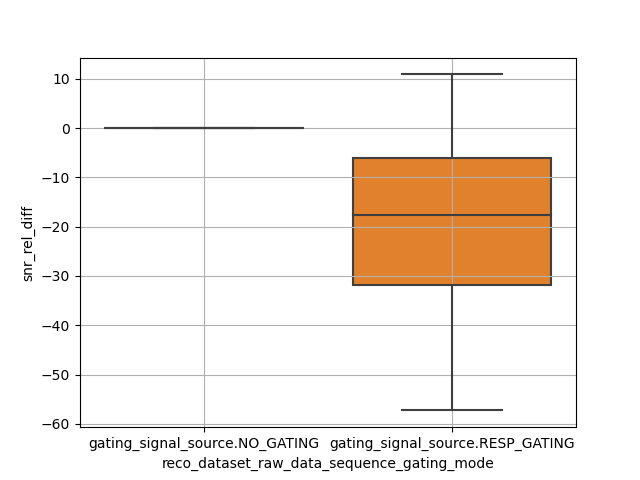

<IPython.core.display.Javascript object>


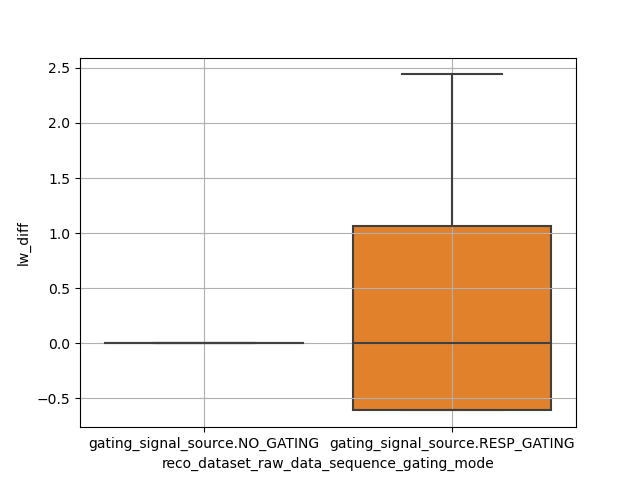

<IPython.core.display.Javascript object>


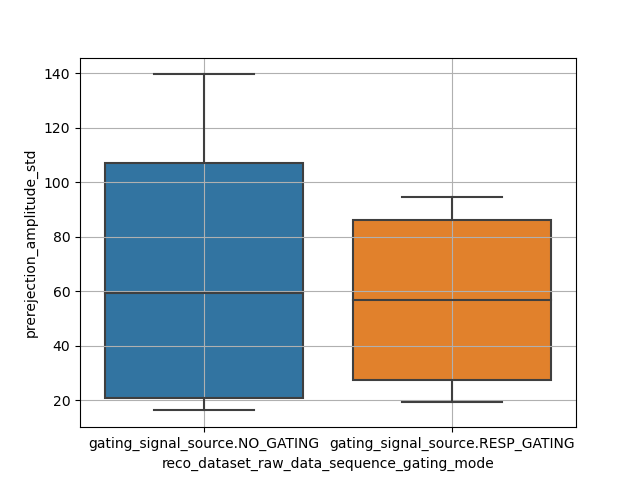

<IPython.core.display.Javascript object>


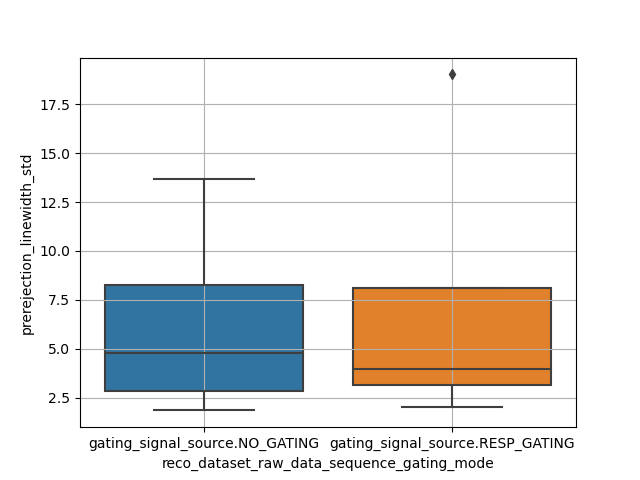

<IPython.core.display.Javascript object>


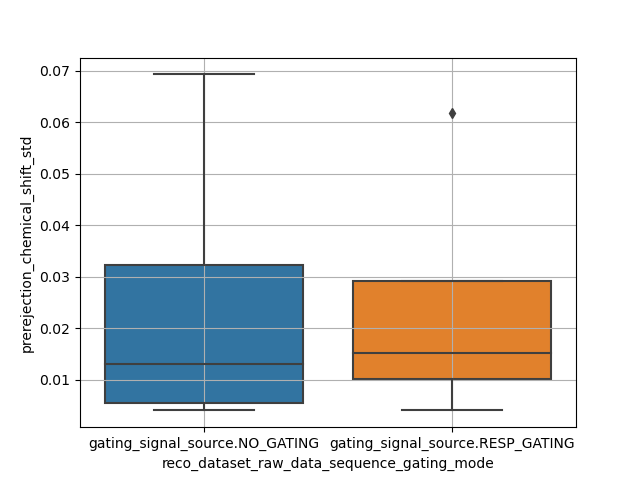

<IPython.core.display.Javascript object>


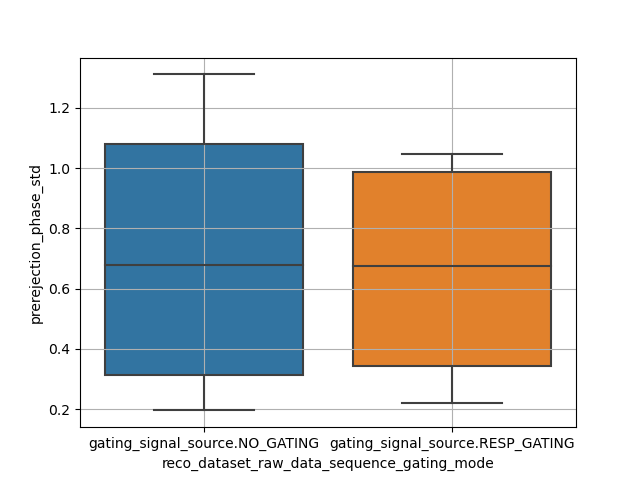

In [66]:
df_gating_tests["reco_dataset_raw_data_sequence_gating_mode"] = df_gating_tests["reco_dataset_raw_data_sequence_gating_mode"].astype(str)
df_gating_tests = df_gating_tests.reset_index()
df_gating_tests = df_gating_tests.sort_values(by=["patient_pass_id", "reco_dataset_raw_data_sequence_gating_mode"])
df_gating_tests[["reco_dataset_raw_data_sequence_gating_mode", "snr_final"]]

df_gating_tests["snr_rel_diff"] = df_gating_tests.groupby(["patient_pass_id"])["snr_final"].pct_change().fillna(0) * 100.0
df_gating_tests["lw_diff"] = df_gating_tests.groupby(["patient_pass_id"])["lw_final"].diff().fillna(0)

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="snr_rel_diff", data=df_gating_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="lw_diff", data=df_gating_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="prerejection_amplitude_std", data=df_gating_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="prerejection_linewidth_std", data=df_gating_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="prerejection_chemical_shift_std", data=df_gating_tests)
plt.grid('on')

plt.figure()
g = sns.boxplot(x="reco_dataset_raw_data_sequence_gating_mode", y="prerejection_phase_std", data=df_gating_tests)
plt.grid('on')

Interesting however poorly significant results:
* too few points for cardiac gating to conclude anything
* the use of resp gating increases signal stability during scan: all peak properties (amplitude, linewidth, chemical shift and phase) standard deviations are reduced
* however, the gain in SNR/LW is really poor when comparing resp to no trig. Need more subjects if I really want to show this.

# Save dataframes to disk

In [67]:
df_sc_all_reco.to_pickle("/home/tangir/crmbm/acq_db/sc_all_reco_notebook.pkl")
df_brain.to_pickle("/home/tangir/crmbm/acq_db/brain_notebook.pkl")